### Data Loading and QC

AnnData object with n_obs × n_vars = 2072 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
<class 'numpy.ndarray'>
[['10012' '7824']
 ['3922' '9038']
 ['3166' '6999']
 ['3465' '7508']
 ['10961' '7174']]
<class 'numpy.ndarray'>
(2072, 2)


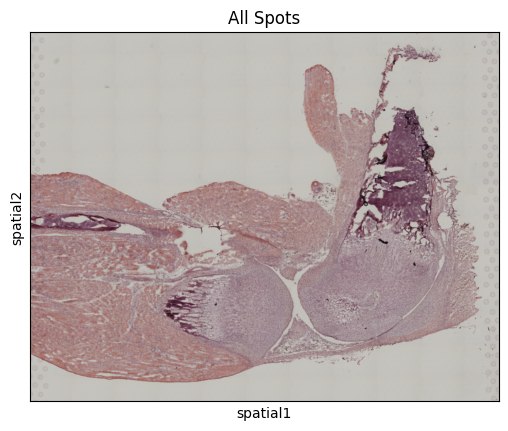

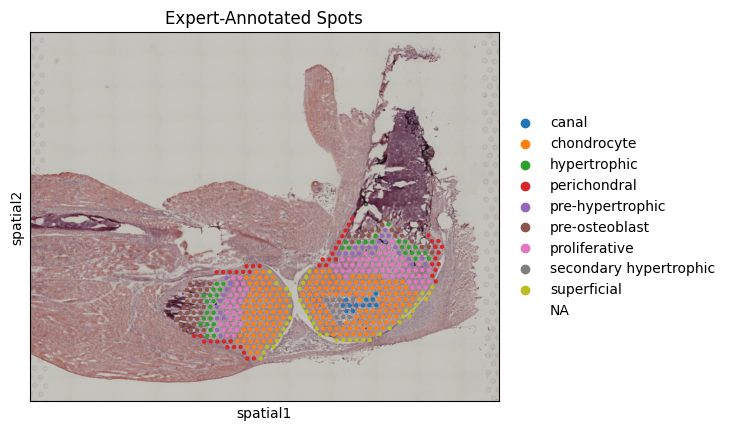

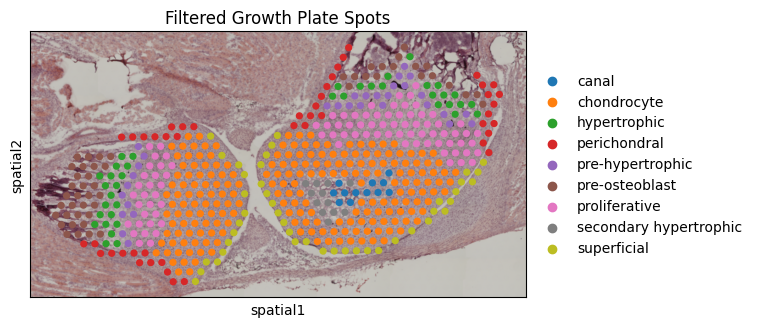

Index(['Ptp4a1', 'Arhgef4', 'Sept2', 'Zc3h11a', 'Gm16701', 'Pakap', 'Gm28710',
       'Jakmip1', 'Fam220a', 'Gm16499', 'Olfr290', 'Aldoa', 'Dpep2', 'Gm16364',
       'C730027H18Rik', 'Ddit3', 'St6galnac2', 'Gm35558', 'Ighv5-8',
       'Ighv1-13', 'Nnt', 'Gm5089', '4930594M22Rik', 'Gm41392', 'Gm38619',
       'Snhg4', 'Pcdha11', 'Gm35438', 'Btbd35f1', 'Fam90a1b', 'Ccl21b',
       'Fam205a4', 'Gm3286', 'Il11ra2', 'Ccl27a', 'Ccl21c', 'Ccl19', 'Ccl21a'],
      dtype='object')


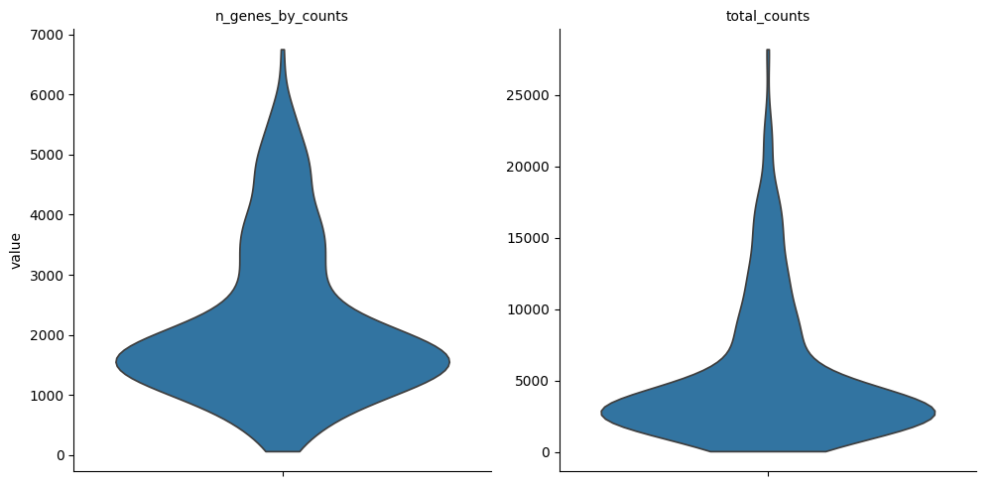

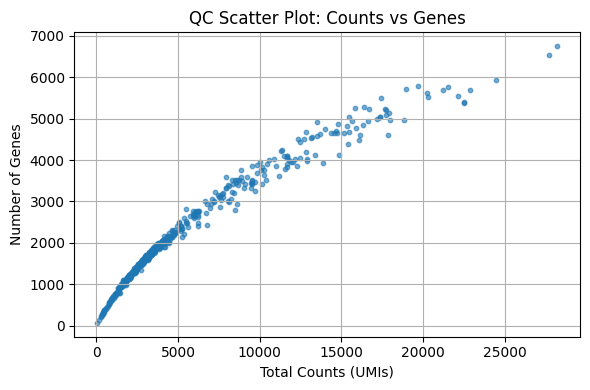

Pearson correlation: r = 0.97


In [149]:
# Install required Python packages
# Uncomment and run these lines if you haven't installed them yet.
# !pip install scanpy squidpy anndata pandas matplotlib seaborn scikit-learn

# ------------------------------------------------------
# 0. Import Required Libraries
# ------------------------------------------------------
import scanpy as sc
import squidpy as sq
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.patches as mpatches

# ------------------------------------------------------
# 1. Load 10X Genomics Visium Spatial Transcriptomics Data
# ------------------------------------------------------
# adata = sq.datasets.visium_fluo("knee")  # Example dataset
adata = sq.read.visium(path="knee_spatial_python/knee", load_images=True)

# Basic overview
print(adata)

# ------------------------------------------------------
# 2. Check and Fix Spatial Coordinates
# ------------------------------------------------------
print(type(adata.obsm['spatial']))
print(adata.obsm['spatial'][:5])  # Preview first 5 rows

# Force proper 2D numpy array
adata.obsm['spatial'] = np.array(adata.obsm['spatial'], dtype=float)
print(type(adata.obsm['spatial']))
print(adata.obsm['spatial'].shape)

# ------------------------------------------------------
# 3. Plot All Spots
# ------------------------------------------------------
sc.pl.spatial(adata, img_key="hires", color=None, title="All Spots")

# ------------------------------------------------------
# 4. Load Expert Annotations
# ------------------------------------------------------
annotations = pd.read_csv("knee_spatial_python/knee/GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv")

annotations["GP"] = annotations["GP"].replace({
    "chondrocytes": "chondrocyte",
    "pre-osteo": "pre-osteoblast",
    "pre-osteoblasr": "pre-osteoblast",
    "secondary hypertophic": "secondary hypertrophic"
})

# Add to AnnData
adata.obs["Expert_Annotation"] = annotations["GP"].values

# ------------------------------------------------------
# 5. Plot Spatial Expression Colored by Expert Annotation
# ------------------------------------------------------
sc.pl.spatial(
    adata,
    img_key="hires",
    color="Expert_Annotation",
    size=1.0,
    title="Expert-Annotated Spots"
)

# Filter spots with no annotation
adata = adata[adata.obs["Expert_Annotation"].notna() & (adata.obs["Expert_Annotation"] != ""), :]

# Plot filtered
sc.pl.spatial(
    adata,
    img_key="hires",
    color="Expert_Annotation",
    size=1.0,
    title="Filtered Growth Plate Spots"
)

# ------------------------------------------------------
# 6. Ensure Unique Gene Names
# ------------------------------------------------------
print(adata.var_names[adata.var_names.duplicated()].unique())
adata.var_names_make_unique()

# ------------------------------------------------------
# 7. Quality Control (QC)
# ------------------------------------------------------
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Violin plots
sc.pl.violin(
    adata,
    keys=["n_genes_by_counts", "total_counts"],
    jitter=0.4,
    multi_panel=True,
    rotation=45,
    stripplot=False,
    show=True
)

# Scatter: total counts vs number of genes
plt.figure(figsize=(6, 4))
plt.scatter(
    adata.obs['total_counts'],
    adata.obs['n_genes_by_counts'],
    s=10,
    alpha=0.6
)
plt.xlabel('Total Counts (UMIs)')
plt.ylabel('Number of Genes')
plt.title('QC Scatter Plot: Counts vs Genes')
plt.grid(True)
plt.tight_layout()
plt.show()

# Pearson correlation
r = np.corrcoef(
    adata.obs['total_counts'],
    adata.obs['n_genes_by_counts']
)[0, 1]
print(f"Pearson correlation: r = {r:.2f}")

# ------------------------------------------------------
# 8. Normalization & HVG Detection
# ------------------------------------------------------
adata.var_names_make_unique()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

valid_genes = np.isfinite(adata.X.mean(axis=0)).A1 if hasattr(adata.X, 'A1') else np.isfinite(adata.X.mean(axis=0))
adata = adata[:, valid_genes]

sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]

# ------------------------------------------------------
# 9. Dimensionality Reduction & Clustering
# ------------------------------------------------------
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.louvain(adata, key_added="louvain")
sc.tl.leiden(adata, key_added="leiden")


### Normalization, PCA, and Clustering methods

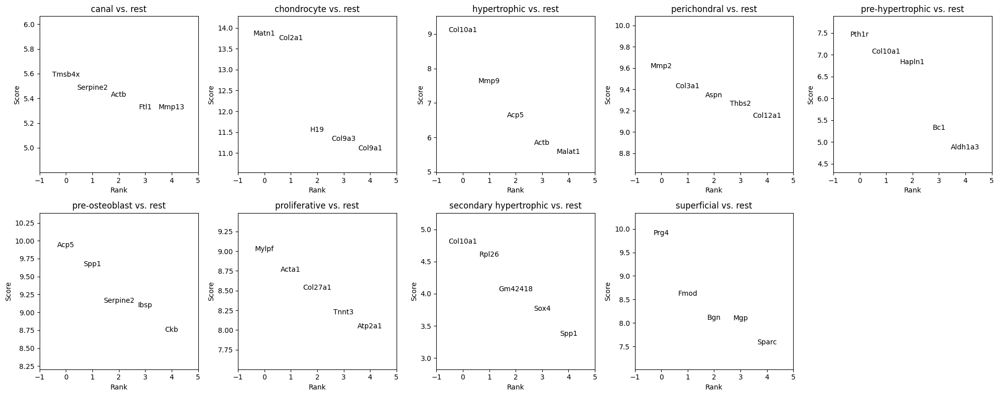

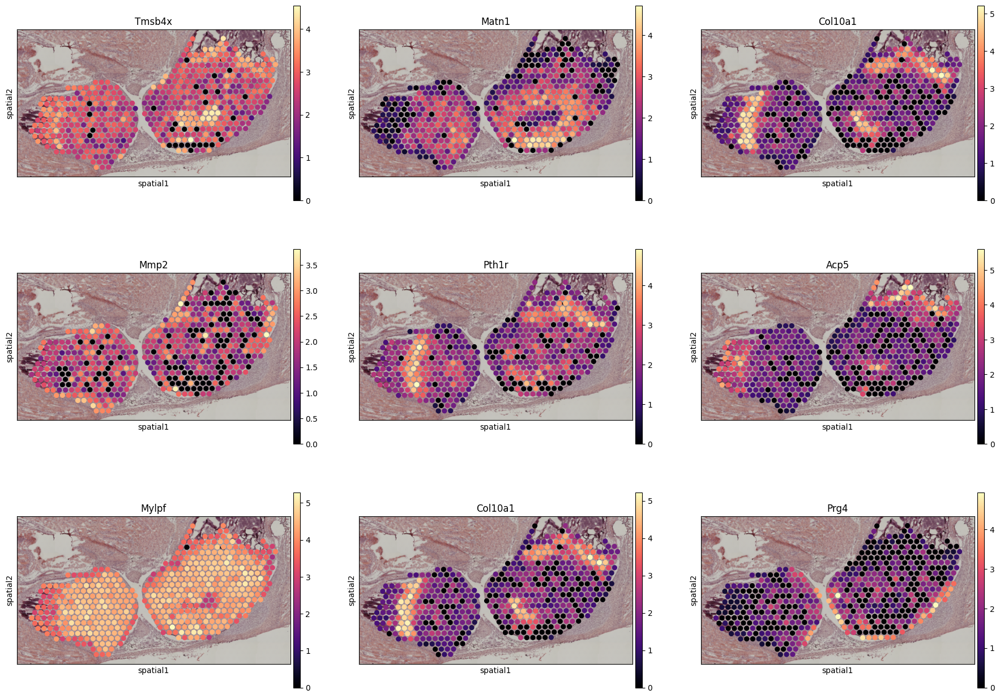

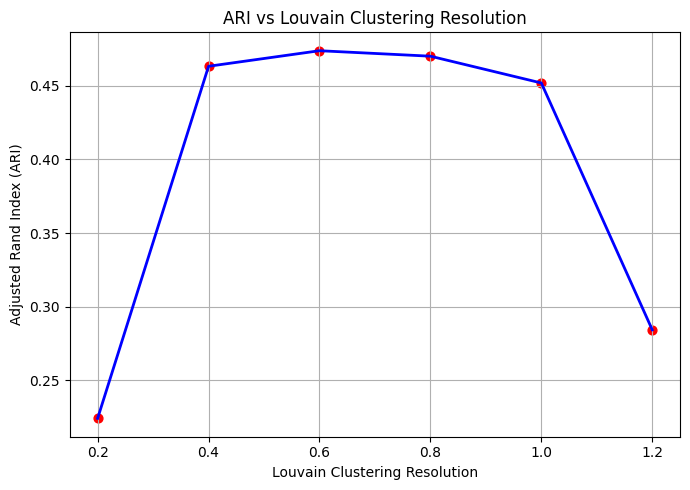

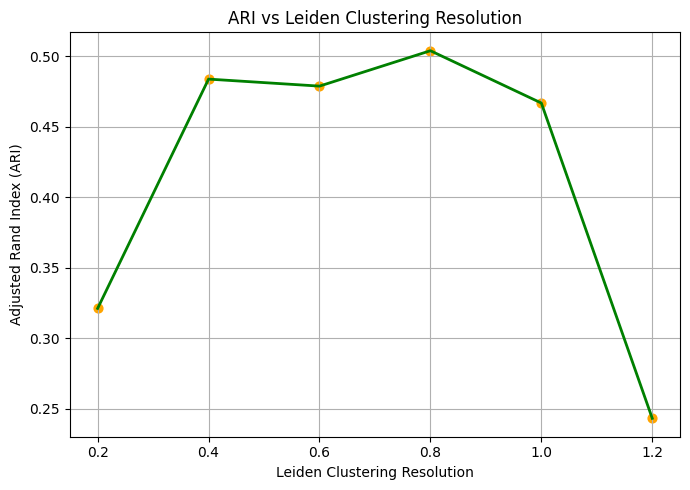

✅ Best Louvain ARI = 0.474 at resolution = 0.6
✅ Best Leiden ARI = 0.504 at resolution = 0.8


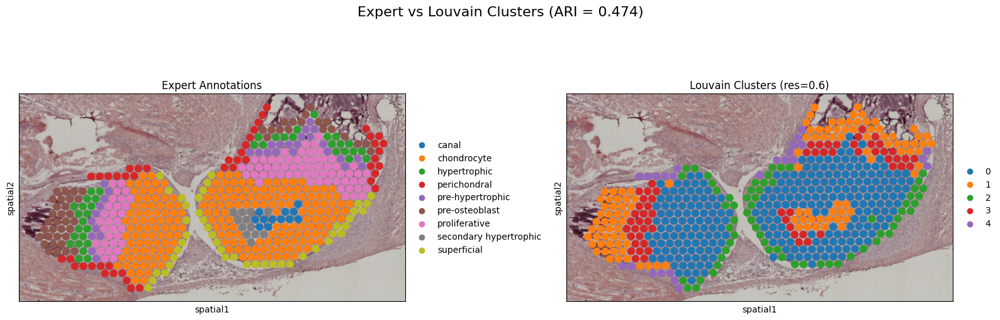

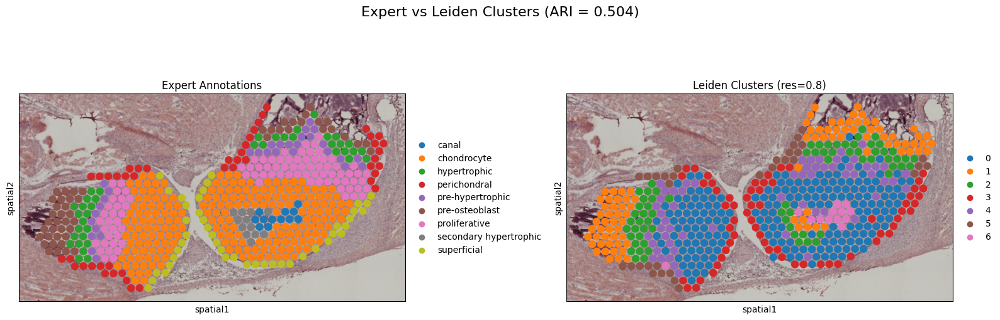

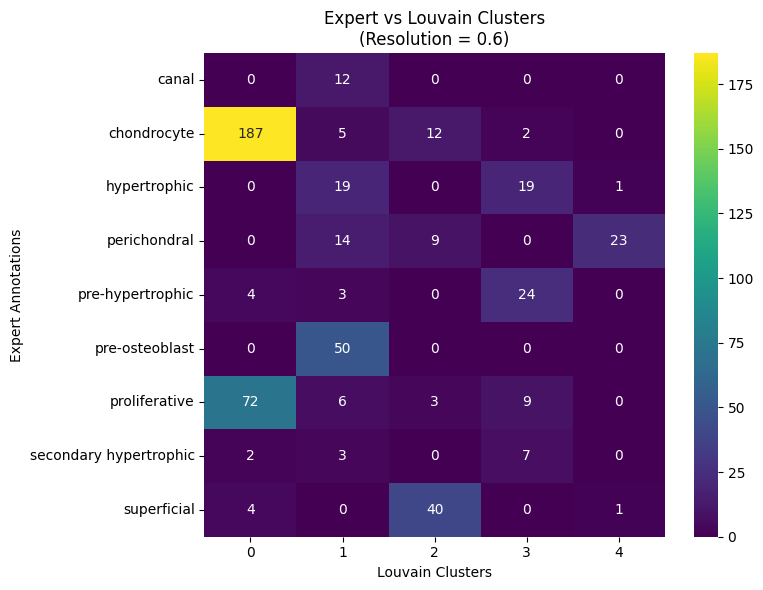

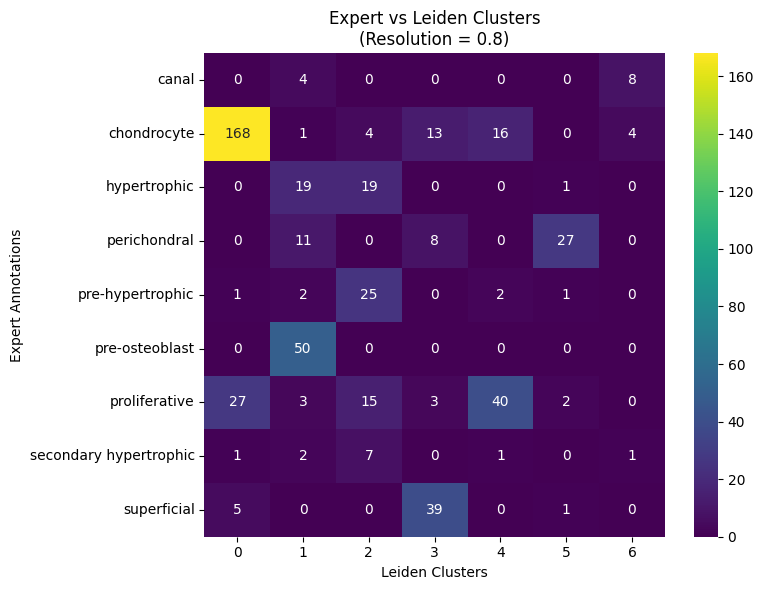

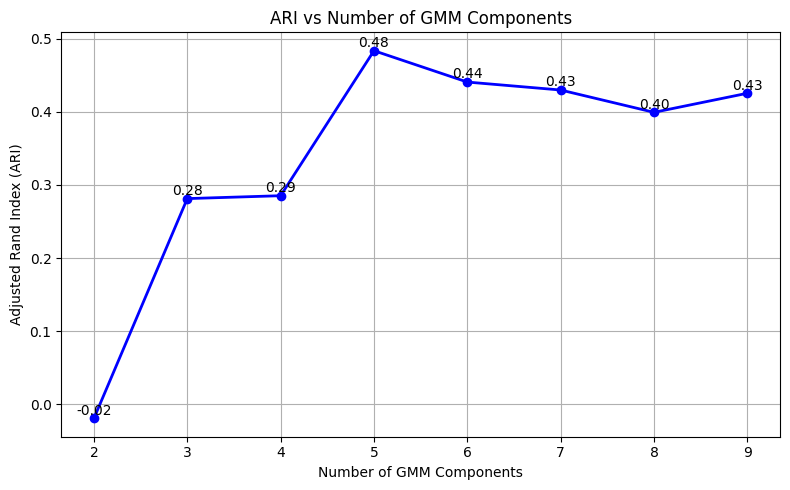

✅ Best ARI = 0.483 at n_components = 5
📁 Plot saved to: results_Python/figures\GMM_ARI_vs_n_components.pdf


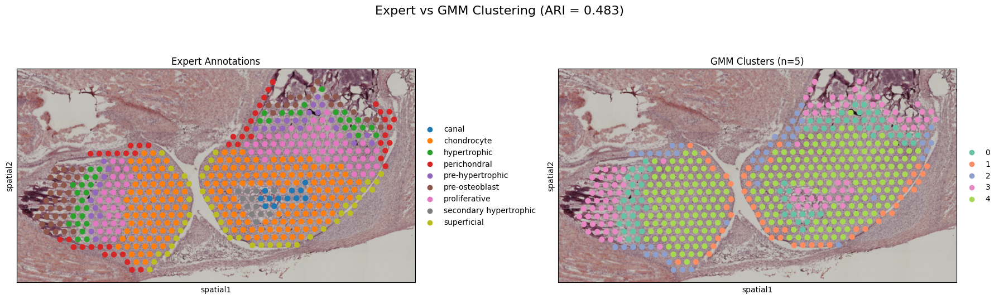

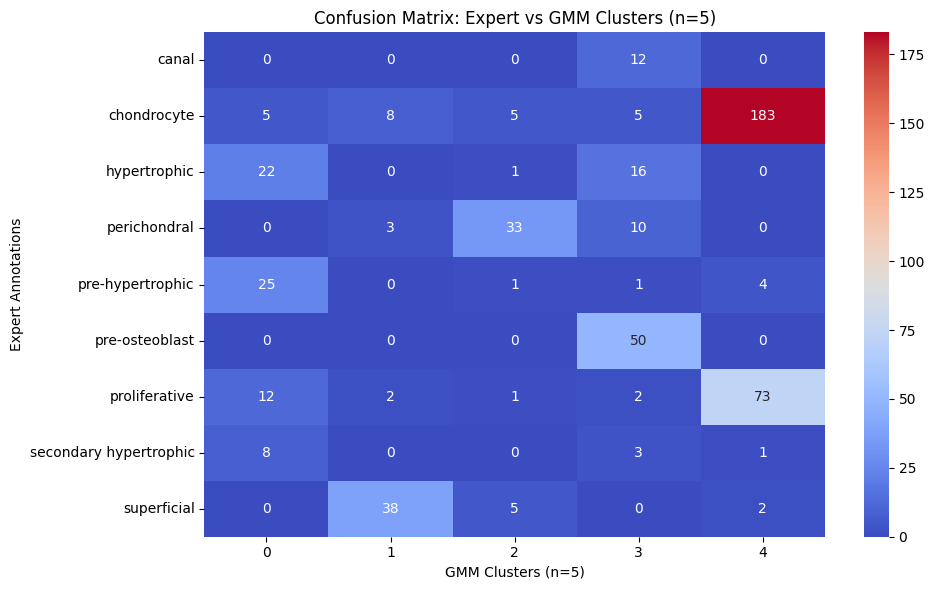

In [150]:
# ------------------------------------------------------
# 10. Differential Expression for Expert Annotation
# ------------------------------------------------------
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Run DE test across Expert_Annotation groups
sc.tl.rank_genes_groups(
    adata,
    groupby="Expert_Annotation",
    method="wilcoxon",
    use_raw=True,
    pts=True
)

# Plot top 5 DE genes per group
n_genes = 5
groups = adata.uns['rank_genes_groups']['names'].dtype.names
rank_genes = adata.uns['rank_genes_groups']

n_cols = 5
n_rows = int(np.ceil(len(groups) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

for idx, group in enumerate(groups):
    ax = axes[idx]
    names = rank_genes['names'][group][:n_genes]
    scores = rank_genes['scores'][group][:n_genes]
    for rank, (name, score) in enumerate(zip(names, scores)):
        ax.text(rank, score, name, ha='center', va='bottom')
    ax.set_title(f'{group} vs. rest')
    ax.set_xlabel("Rank")
    ax.set_ylabel("Score")
    ax.set_xlim(-1, n_genes)
    ax.set_ylim(np.min(scores) - 0.5, np.max(scores) + 0.5)

for j in range(len(groups), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Save DEGs
degs = sc.get.rank_genes_groups_df(adata, group=None)
degs['gene_base'] = degs['names'].str.replace(r'\.\d+$', '', regex=True)
degs.to_csv("Expert_Annotation_DEGs.csv", index=False)

# Plot top marker for each annotation
top_genes = degs.groupby("group")["names"].first().tolist()
sc.pl.spatial(
    adata,
    color=top_genes,
    img_key="hires",
    ncols=3,
    size=1.3,
    cmap="magma"
)



# ------------------------------------------------------
# 11. Compare DEGs with Louvain & Leiden Clusters
# ------------------------------------------------------
sc.tl.rank_genes_groups(adata, groupby="louvain", method="wilcoxon")
sc.tl.rank_genes_groups(adata, groupby="leiden", method="wilcoxon")

deg_all = sc.get.rank_genes_groups_df(adata, group=None)
deg_all['gene_base'] = deg_all['names'].str.replace(r'\.\d+$', '', regex=True)

# ------------------------------------------------------
# 12. Evaluate Louvain and Leiden Clustering (ARI vs Expert)
# ------------------------------------------------------
import os
from sklearn.metrics import adjusted_rand_score
import seaborn as sns
from matplotlib.colors import to_hex

output_dir = "results_Python/figures"
os.makedirs(output_dir, exist_ok=True)

adata.obs['Expert_Annotation'] = adata.obs['Expert_Annotation'].astype(str)
true_labels = pd.Categorical(adata.obs["Expert_Annotation"]).codes

resolutions = np.arange(0.2, 1.4, 0.2)

def evaluate_clustering(method):
    ari_scores = []
    for res in resolutions:
        key = f"{method}_{res:.1f}"
        if method == "louvain":
            sc.tl.louvain(adata, resolution=res, key_added=key, random_state=123)
        elif method == "leiden":
            sc.tl.leiden(adata, resolution=res, key_added=key, random_state=123)
        pred_labels = pd.Categorical(adata.obs[key]).codes
        ari = adjusted_rand_score(true_labels, pred_labels)
        ari_scores.append(ari)
    return pd.DataFrame({"Resolution": resolutions, "ARI": ari_scores})

louvain_df = evaluate_clustering("louvain")
leiden_df = evaluate_clustering("leiden")

# Plot ARI vs resolution
plt.figure(figsize=(7, 5))
plt.plot(louvain_df["Resolution"], louvain_df["ARI"], color="blue", linewidth=2, label="Louvain")
plt.scatter(louvain_df["Resolution"], louvain_df["ARI"], color="red", s=40)
plt.title("ARI vs Louvain Clustering Resolution")
plt.xlabel("Louvain Clustering Resolution")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{output_dir}/Louvain_ARI_vs_Resolution.pdf", dpi=300)
plt.show()

plt.figure(figsize=(7, 5))
plt.plot(leiden_df["Resolution"], leiden_df["ARI"], color="green", linewidth=2, label="Leiden")
plt.scatter(leiden_df["Resolution"], leiden_df["ARI"], color="orange", s=40)
plt.title("ARI vs Leiden Clustering Resolution")
plt.xlabel("Leiden Clustering Resolution")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{output_dir}/Leiden_ARI_vs_Resolution.pdf", dpi=300)
plt.show()

# Best resolutions
best_louvain_res = louvain_df.loc[louvain_df["ARI"].idxmax(), "Resolution"]
best_leiden_res = leiden_df.loc[leiden_df["ARI"].idxmax(), "Resolution"]
best_louvain_ari = louvain_df["ARI"].max()
best_leiden_ari = leiden_df["ARI"].max()

print(f"✅ Best Louvain ARI = {best_louvain_ari:.3f} at resolution = {best_louvain_res:.1f}")
print(f"✅ Best Leiden ARI = {best_leiden_ari:.3f} at resolution = {best_leiden_res:.1f}")

# ------------------------------------------------------
# 13. Spatial Plots: Louvain & Leiden vs Expert
# ------------------------------------------------------
for method, best_res, best_ari in [("louvain", best_louvain_res, best_louvain_ari),
                                   ("leiden", best_leiden_res, best_leiden_ari)]:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sc.pl.spatial(adata, color="Expert_Annotation", img_key="hires", size=1.4,
                  title="Expert Annotations", legend_loc='right margin',
                  ax=axes[0], show=False)
    sc.pl.spatial(adata, color=f"{method}_{best_res:.1f}", img_key="hires", size=1.4,
                  title=f"{method.capitalize()} Clusters (res={best_res:.1f})",
                  legend_loc='right margin', ax=axes[1], show=False)
    plt.suptitle(f"Expert vs {method.capitalize()} Clusters (ARI = {best_ari:.3f})", fontsize=16)
    plt.tight_layout()
    plt.savefig(f"{output_dir}/Expert_vs_{method}_best.png", dpi=300, bbox_inches='tight')
    plt.show()

# Confusion matrices
for method, best_res in [("louvain", best_louvain_res), ("leiden", best_leiden_res)]:
    cluster_col = f"{method}_{best_res:.1f}"
    adata.obs[cluster_col] = adata.obs[cluster_col].astype(str)
    expert_labels = adata.obs["Expert_Annotation"]
    cluster_labels = adata.obs[cluster_col]
    conf_matrix = pd.crosstab(expert_labels, cluster_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="viridis")
    plt.title(f"Expert vs {method.capitalize()} Clusters\n(Resolution = {best_res:.1f})")
    plt.xlabel(f"{method.capitalize()} Clusters")
    plt.ylabel("Expert Annotations")
    plt.tight_layout()
    plt.savefig(f"{output_dir}/ConfusionMatrix_{method}_bestRes.png", dpi=300)
    plt.show()

# ------------------------------------------------------
# 14. GMM Clustering on PCA Features
# ------------------------------------------------------
from sklearn.mixture import GaussianMixture
import warnings

if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9].astype(np.float64)
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

ari_scores = []
n_components_range = range(2, 10)
for n in n_components_range:
    try:
        gmm = GaussianMixture(n_components=n, random_state=123, reg_covar=1e-4)
        gmm_labels = gmm.fit_predict(pca_data)
        ari = adjusted_rand_score(true_labels, gmm_labels)
        ari_scores.append(ari)
        adata.obs[f'GMM_{n}'] = gmm_labels.astype(str)
    except ValueError as e:
        warnings.warn(f"GMM failed for n_components={n}: {e}")
        ari_scores.append(np.nan)

plt.figure(figsize=(8, 5))
plt.plot(n_components_range, ari_scores, marker='o', color='blue', linewidth=2)
plt.title("ARI vs Number of GMM Components")
plt.xlabel("Number of GMM Components")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.xticks(n_components_range)
for i, score in enumerate(ari_scores):
    if not np.isnan(score):
        plt.text(n_components_range[i], score + 0.005, f"{score:.2f}", ha='center')
plt.tight_layout()
output_file = os.path.join(output_dir, "GMM_ARI_vs_n_components.pdf")
plt.savefig(output_file, dpi=300)
plt.show()

best_index = np.nanargmax(ari_scores)
best_n = n_components_range[best_index]
best_ari = ari_scores[best_index]
print(f"✅ Best ARI = {best_ari:.3f} at n_components = {best_n}")
print(f"📁 Plot saved to: {output_file}")

# Color palette for best GMM
unique_clusters = adata.obs[f"GMM_{best_n}"].unique()
palette = sns.color_palette("Set2", len(unique_clusters))
gmm_colors = dict(zip(map(str, sorted(map(int, unique_clusters))), map(to_hex, palette)))

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.0,
    title="Expert Annotations",
    legend_loc='right margin',
    ax=axes[0],
    show=False
)
sc.pl.spatial(
    adata,
    color=f"GMM_{best_n}",
    img_key="hires",
    size=1.0,
    title=f"GMM Clusters (n={best_n})",
    palette=gmm_colors,
    legend_loc='right margin',
    ax=axes[1],
    show=False
)
plt.suptitle(f"Expert vs GMM Clustering (ARI = {best_ari:.3f})", fontsize=16)
plt.tight_layout()
plt.savefig(f"{output_dir}/Expert_vs_GMM_n{best_n}.png", dpi=300, bbox_inches='tight')
plt.show()

# Confusion Matrix for best GMM
cluster_col = f"GMM_{best_n}"
adata.obs[cluster_col] = adata.obs[cluster_col].astype(str)
conf_matrix = pd.crosstab(adata.obs["Expert_Annotation"], adata.obs[cluster_col])
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="coolwarm")
plt.title(f"Confusion Matrix: Expert vs GMM Clusters (n={best_n})")
plt.xlabel(f"GMM Clusters (n={best_n})")
plt.ylabel("Expert Annotations")
plt.tight_layout()
plt.savefig(f"{output_dir}/ConfusionMatrix_GMM_n{best_n}.png", dpi=300)
plt.show()


### Prepare DEG Table With Significance Annotation

In [151]:
import pandas as pd
import numpy as np

# Add significance flags
degs["sig"] = np.where(
    (degs["pvals_adj"] < 0.05) & (np.abs(degs["logfoldchanges"]) > 0.5),
    "Significant", "Not Significant"
)

# Optional: strip numeric suffixes from gene names
degs["gene_base"] = degs["names"].str.replace(r"\.\d+$", "", regex=True)


### Volcano plot

In [152]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
from adjustText import adjust_text

# Ensure output folder exists
os.makedirs("results_Python/figures", exist_ok=True)

# PDF output path
pdf_path = "results_Python/figures/All_Cluster_Volcano_Plots_Adjusted.pdf"

# Generate volcano plots with non-overlapping labels
with PdfPages(pdf_path) as pdf:
    for cluster in degs["group"].unique():
        cluster_deg = degs[degs["group"] == cluster].copy()

        # Select top 7 significant genes
        top_genes = (
            cluster_deg[cluster_deg["sig"] == "Significant"]
            .sort_values("pvals_adj")
            .head(7)
        )

        # Volcano plot
        plt.figure(figsize=(6, 5))
        ax = sns.scatterplot(
            data=cluster_deg,
            x="logfoldchanges",
            y=-np.log10(cluster_deg["pvals_adj"]),
            hue="sig",
            palette={"Significant": "red", "Not Significant": "gray"},
            edgecolor=None,
            s=20
        )

        # Add non-overlapping labels for top genes
        texts = []
        for _, row in top_genes.iterrows():
            x = row["logfoldchanges"]
            y = -np.log10(row["pvals_adj"])
            texts.append(ax.text(x, y, row["gene_base"], fontsize=9))

        adjust_text(
            texts,
            arrowprops=dict(arrowstyle="-", color='black', lw=0.5),
            expand_text=(1.1, 1.3)
        )

        # Title and formatting
        plt.title(f"Volcano Plot: {cluster}")
        plt.xlabel("log2 Fold Change")
        plt.ylabel("-log10 Adjusted P-value")
        plt.legend(title="Significance")
        plt.tight_layout()

        # Save this plot page into the PDF
        pdf.savefig()
        plt.close()

print(f"✅ Volcano plots PDF with clear labels saved to:\n{pdf_path}")


✅ Volcano plots PDF with clear labels saved to:
results_Python/figures/All_Cluster_Volcano_Plots_Adjusted.pdf


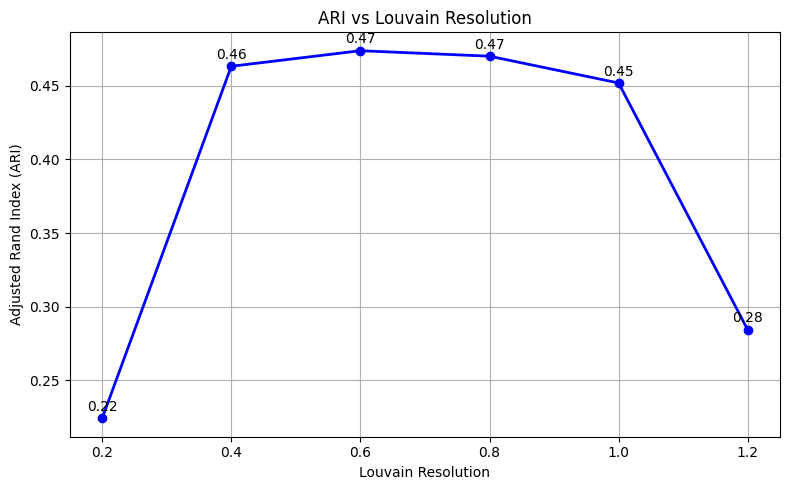

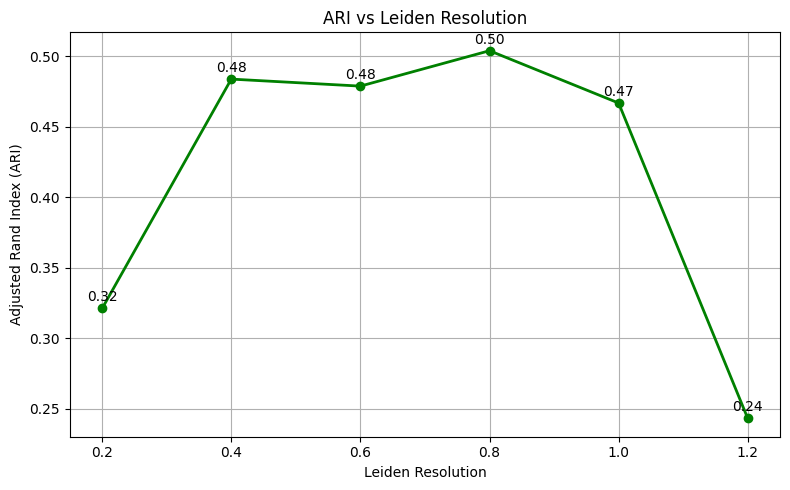

In [153]:
# Louvain Plot
plt.figure(figsize=(8, 5))
plt.plot(louvain_df["Resolution"], louvain_df["ARI"], marker='o', color='blue', linewidth=2)
plt.title("ARI vs Louvain Resolution")
plt.xlabel("Louvain Resolution")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.xticks(resolutions)
for i, score in enumerate(louvain_df["ARI"]):
    plt.text(resolutions[i], score + 0.005, f"{score:.2f}", ha='center')
plt.tight_layout()
plt.savefig(f"{output_dir}/Louvain_ARI_vs_Resolution_LikeGMM.pdf", dpi=300)
plt.show()

# Leiden Plot
plt.figure(figsize=(8, 5))
plt.plot(leiden_df["Resolution"], leiden_df["ARI"], marker='o', color='green', linewidth=2)
plt.title("ARI vs Leiden Resolution")
plt.xlabel("Leiden Resolution")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.xticks(resolutions)
for i, score in enumerate(leiden_df["ARI"]):
    plt.text(resolutions[i], score + 0.005, f"{score:.2f}", ha='center')
plt.tight_layout()
plt.savefig(f"{output_dir}/Leiden_ARI_vs_Resolution_LikeGMM.pdf", dpi=300)
plt.show()


### HClust and Bayesspace clustering method

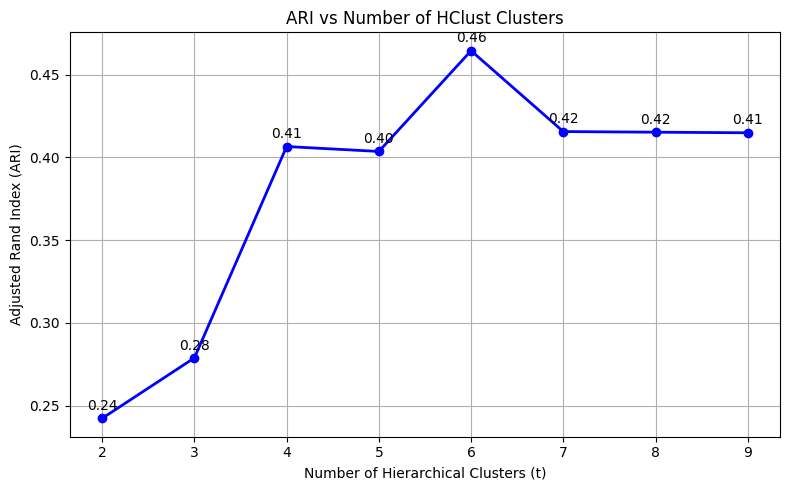

✅ Best ARI = 0.464 at t = 6
📁 Plot saved to: results_Python/figures\HClust_ARI_vs_t.pdf


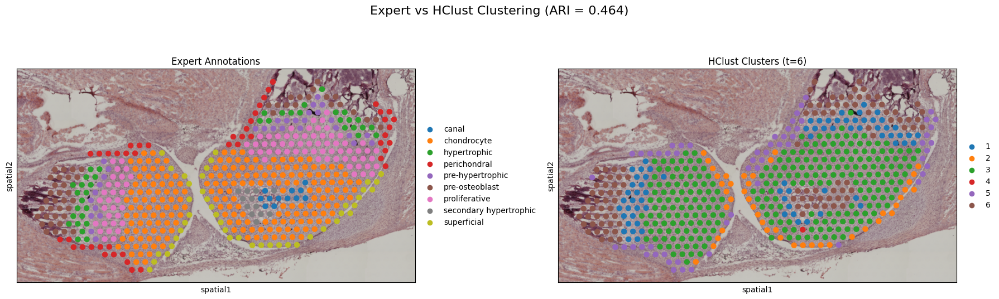

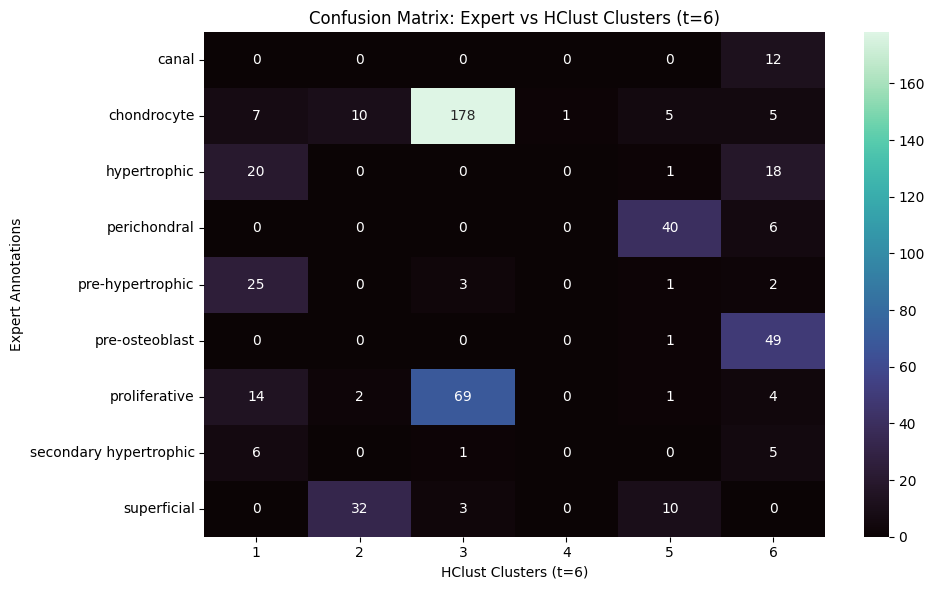

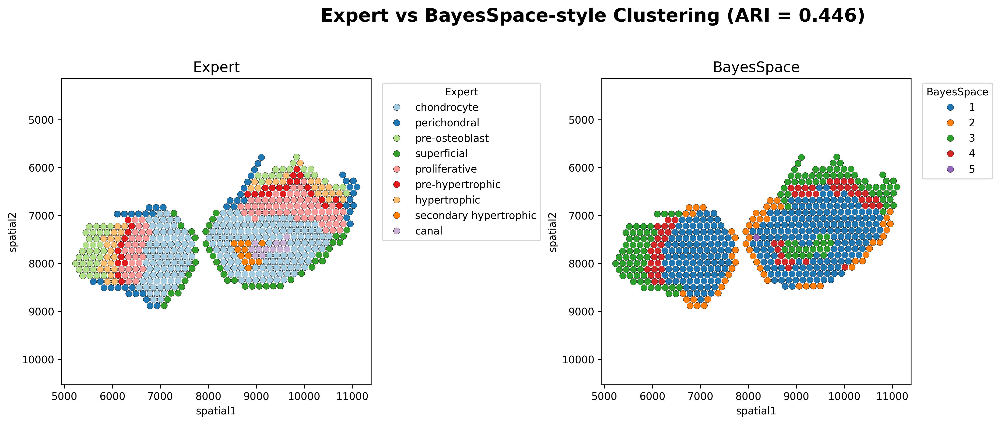

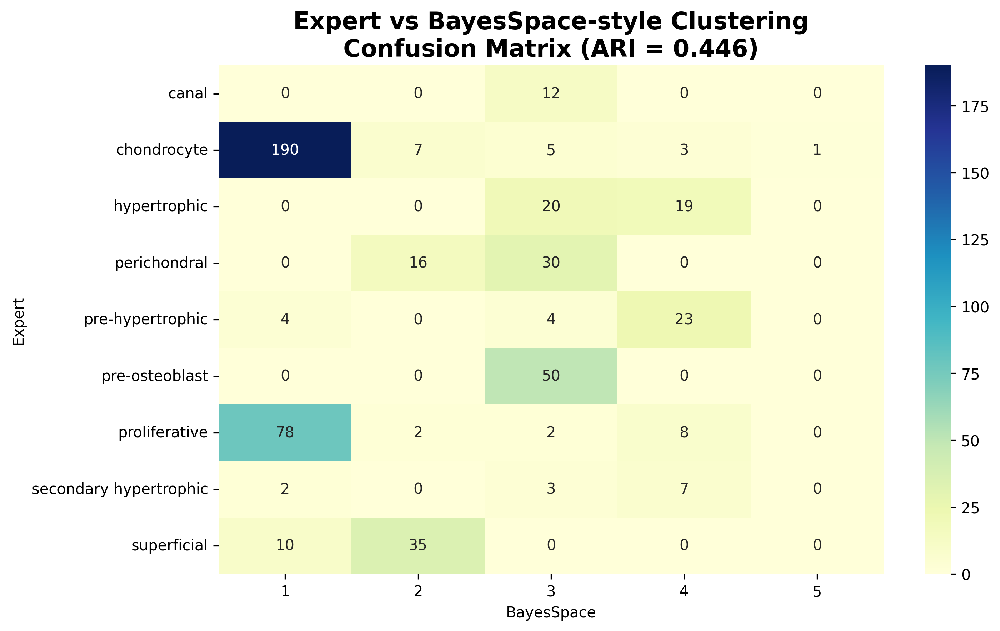

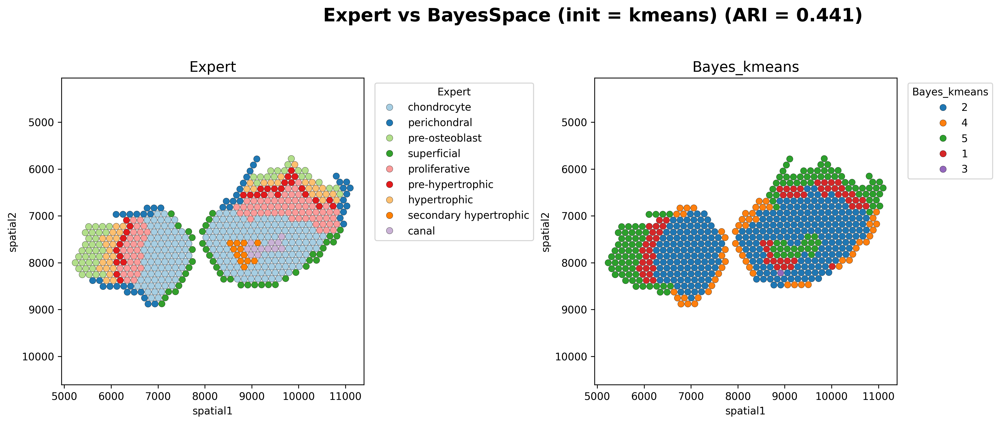

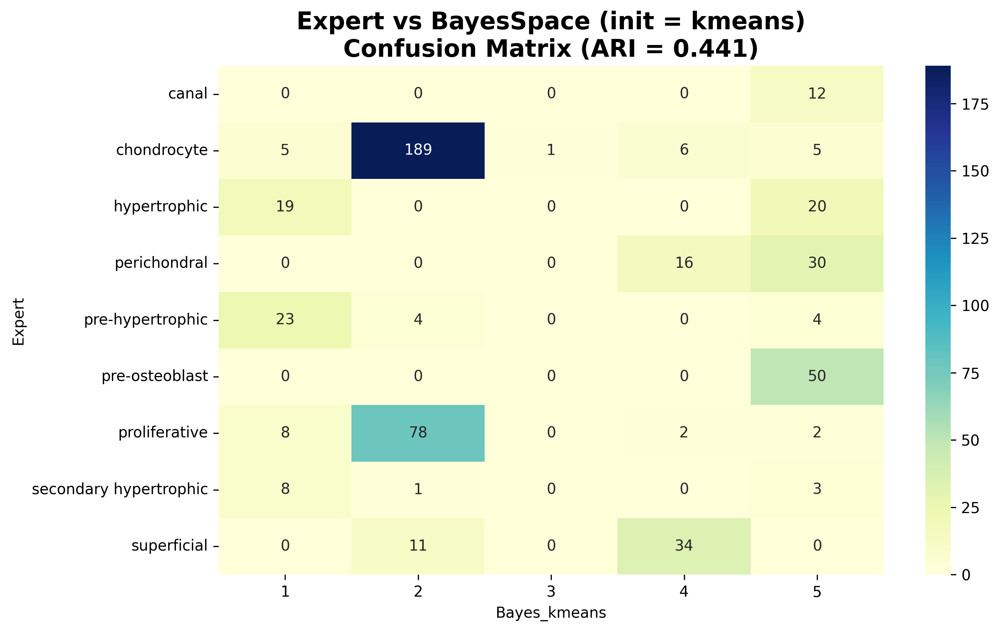

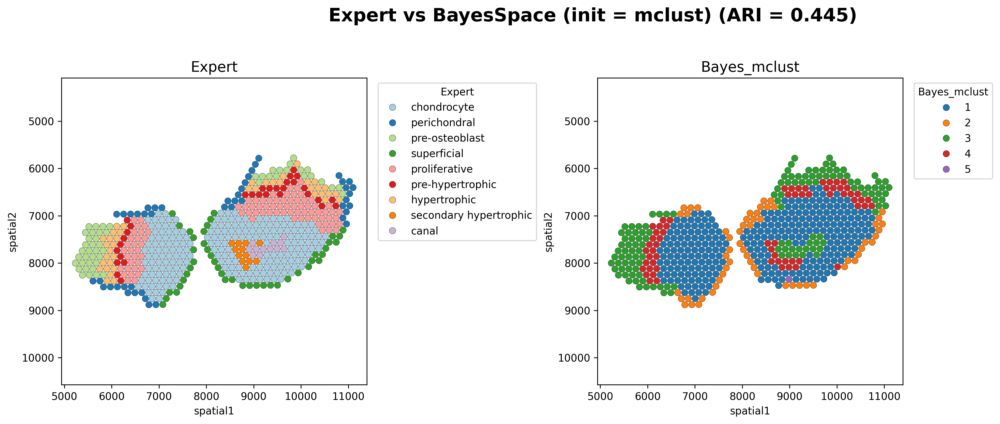

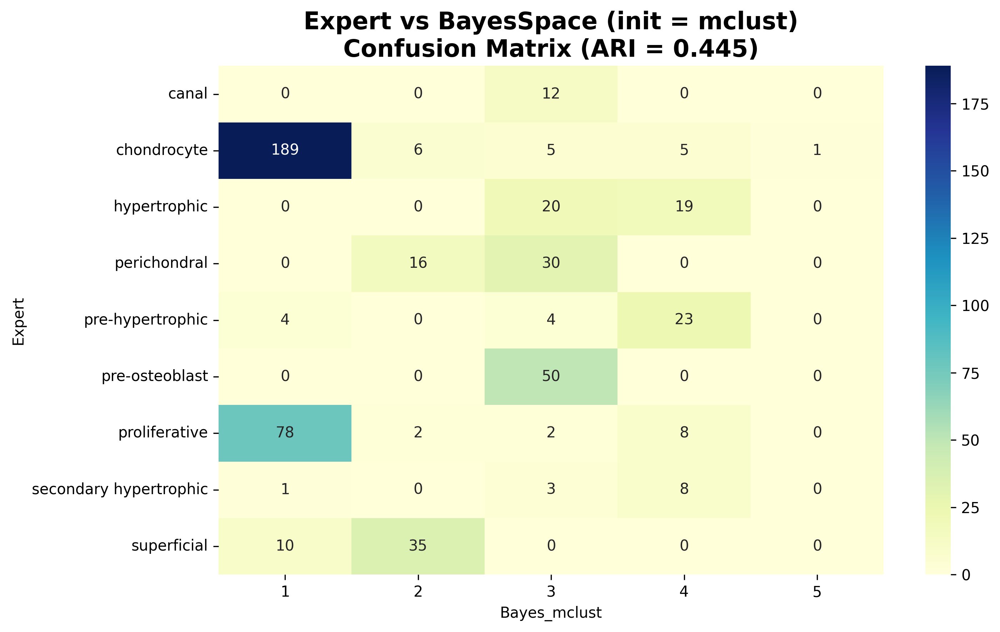

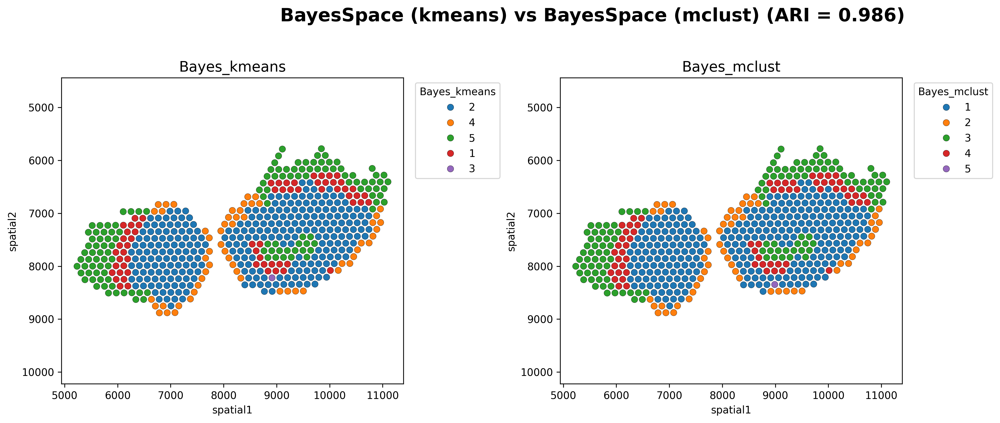

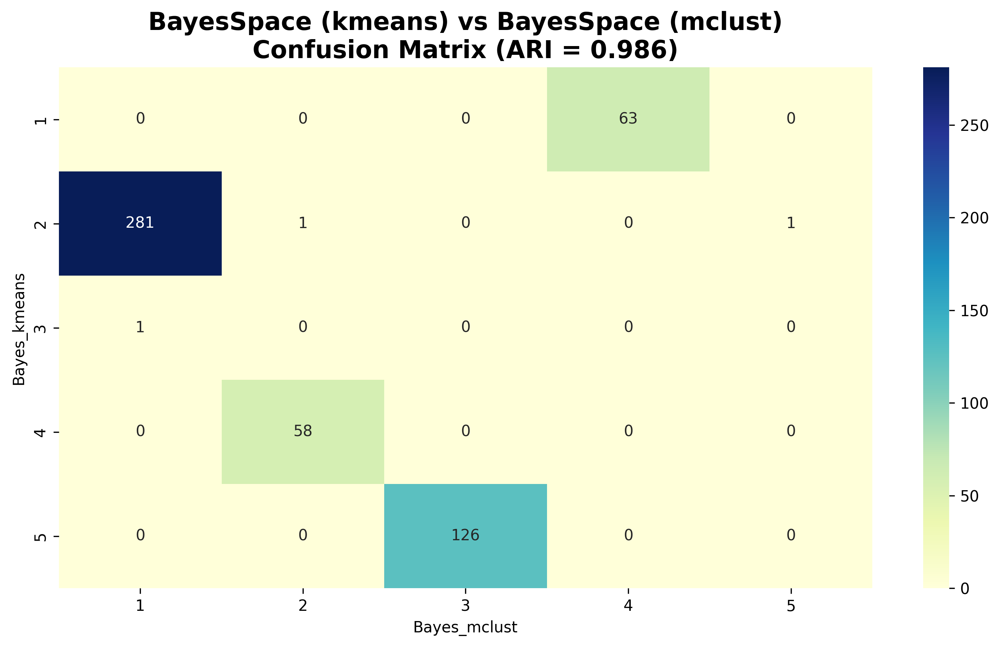

In [154]:
# ------------------------------------------------------
# 15. Hierarchical Clustering (HClust) on PCA Features
# ------------------------------------------------------
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist

if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9]
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

linkage_matrix = linkage(pdist(pca_data), method='ward')

t_range = range(2, 10)
ari_scores = []

for t in t_range:
    labels = fcluster(linkage_matrix, t=t, criterion='maxclust')
    ari = adjusted_rand_score(true_labels, labels)
    ari_scores.append(ari)
    adata.obs[f'HClust_{t}'] = pd.Categorical(labels.astype(str))

plt.figure(figsize=(8, 5))
plt.plot(t_range, ari_scores, marker='o', color='blue', linewidth=2)
plt.title("ARI vs Number of HClust Clusters")
plt.xlabel("Number of Hierarchical Clusters (t)")
plt.ylabel("Adjusted Rand Index (ARI)")
plt.grid(True)
plt.xticks(t_range)
for i, score in enumerate(ari_scores):
    plt.text(t_range[i], score + 0.005, f"{score:.2f}", ha='center')
plot_file = os.path.join(output_dir, "HClust_ARI_vs_t.pdf")
plt.tight_layout()
plt.savefig(plot_file, dpi=300)
plt.show()

best_index = np.argmax(ari_scores)
best_t = t_range[best_index]
best_ari = ari_scores[best_index]
print(f"✅ Best ARI = {best_ari:.3f} at t = {best_t}")
print(f"📁 Plot saved to: {plot_file}")

# Side-by-side plot
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.0,
    title="Expert Annotations",
    legend_loc='right margin',
    ax=axes[0],
    show=False
)
sc.pl.spatial(
    adata,
    color=f"HClust_{best_t}",
    img_key="hires",
    size=1.0,
    title=f"HClust Clusters (t={best_t})",
    legend_loc='right margin',
    ax=axes[1],
    show=False
)
plt.suptitle(f"Expert vs HClust Clustering (ARI = {best_ari:.3f})", fontsize=16)
final_plot_file = os.path.join(output_dir, f"Expert_vs_HClust_t{best_t}.png")
plt.tight_layout()
plt.savefig(final_plot_file, dpi=300, bbox_inches='tight')
plt.show()

# Confusion Matrix Heatmap for HClust
cluster_col = f"HClust_{best_t}"
adata.obs[cluster_col] = adata.obs[cluster_col].astype(str)
conf_matrix = pd.crosstab(adata.obs["Expert_Annotation"], adata.obs[cluster_col])
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="mako")
plt.title(f"Confusion Matrix: Expert vs HClust Clusters (t={best_t})")
plt.xlabel(f"HClust Clusters (t={best_t})")
plt.ylabel("Expert Annotations")
heatmap_file = os.path.join(output_dir, f"ConfusionMatrix_HClust_t{best_t}.png")
plt.tight_layout()
plt.savefig(heatmap_file, dpi=300)
plt.show()

# ------------------------------------------------------
# 16. BayesSpace Data Integration
# ------------------------------------------------------
base_path = "C:/Users/abuhu/cellpie/cellpie/"
input_path = base_path + "bayesspace_input/"
expert_path = base_path + "knee_spatial_python/knee/data/slide1_WTM/GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv"

counts = pd.read_csv(input_path + "counts_matrix.csv", header=None)
coords = pd.read_csv(input_path + "spatial_coords.csv", index_col=0)
meta = pd.read_csv(input_path + "metadata.csv", index_col=0)

clusters_main = pd.read_csv(base_path + "bayesspace_clusters.csv", index_col=0)
clusters_kmeans = pd.read_csv(base_path + "bayesspace_clusters_kmeans.csv", header=0)
clusters_mclust = pd.read_csv(base_path + "bayesspace_clusters_mclust.csv", header=0)

expert = pd.read_csv(expert_path)
expert["GP"] = expert["GP"].replace({
    "chondrocytes": "chondrocyte",
    "pre-osteo": "pre-osteoblast",
    "pre-osteoblasr": "pre-osteoblast",
    "secondary hypertophic": "secondary hypertrophic"
})
expert = expert.set_index("Barcode").loc[meta.index]

meta["Expert"] = expert["GP"].values
meta["spatial1"] = coords.iloc[:, 0].values
meta["spatial2"] = coords.iloc[:, 1].values
meta["BayesSpace"] = clusters_main.values[:, 0]
meta["Bayes_kmeans"] = clusters_kmeans.values[:, 0]
meta["Bayes_mclust"] = clusters_mclust.values[:, 0]

meta.to_csv(os.path.join(output_dir, "full_meta_with_all_clusters.csv"))

# ------------------------------------------------------
# 17. BayesSpace vs Expert Comparison
# ------------------------------------------------------
comparisons = [
    ("Expert", "BayesSpace", "Expert vs BayesSpace-style Clustering"),
    ("Expert", "Bayes_kmeans", "Expert vs BayesSpace (init = kmeans)"),
    ("Expert", "Bayes_mclust", "Expert vs BayesSpace (init = mclust)"),
    ("Bayes_kmeans", "Bayes_mclust", "BayesSpace (kmeans) vs BayesSpace (mclust)")
]

for col1, col2, title in comparisons:
    meta[col1] = meta[col1].astype(str)
    meta[col2] = meta[col2].astype(str)
    ari = adjusted_rand_score(meta[col1], meta[col2])
    title_with_ari = f"{title} (ARI = {ari:.3f})"

    # Scatter Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), dpi=300)
    fig.suptitle(title_with_ari, fontsize=18, fontweight='bold')
    for ax, col, label in zip(axes, [col1, col2], [col1, col2]):
        sns.scatterplot(
            data=meta,
            x="spatial1", y="spatial2",
            hue=meta[col],
            palette="Paired" if col == "Expert" else "tab10",
            s=40, edgecolor='black', linewidth=0.2, ax=ax, legend='full'
        )
        ax.invert_yaxis()
        ax.set_title(label, fontsize=14)
        ax.axis("equal")
        ax.set_xlabel("spatial1")
        ax.set_ylabel("spatial2")
        ax.legend(title=label, bbox_to_anchor=(1.02, 1), loc='upper left')
    scatter_filename = f"{output_dir}/ARI_{col1}_vs_{col2}_scatter.png".replace(" ", "_")
    plt.tight_layout(rect=[0, 0.03, 0.85, 0.95])
    plt.savefig(scatter_filename, dpi=300, bbox_inches="tight")
    plt.show()

    # Confusion Matrix
    conf_matrix = pd.crosstab(meta[col1], meta[col2])
    plt.figure(figsize=(10, 6), dpi=300)
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="YlGnBu")
    plt.title(f"{title}\nConfusion Matrix (ARI = {ari:.3f})", fontsize=16, fontweight='bold')
    plt.xlabel(col2)
    plt.ylabel(col1)
    plt.tight_layout()
    heatmap_filename = f"{output_dir}/ConfusionMatrix_{col1}_vs_{col2}.png".replace(" ", "_")
    plt.savefig(heatmap_filename, dpi=300)
    plt.show()


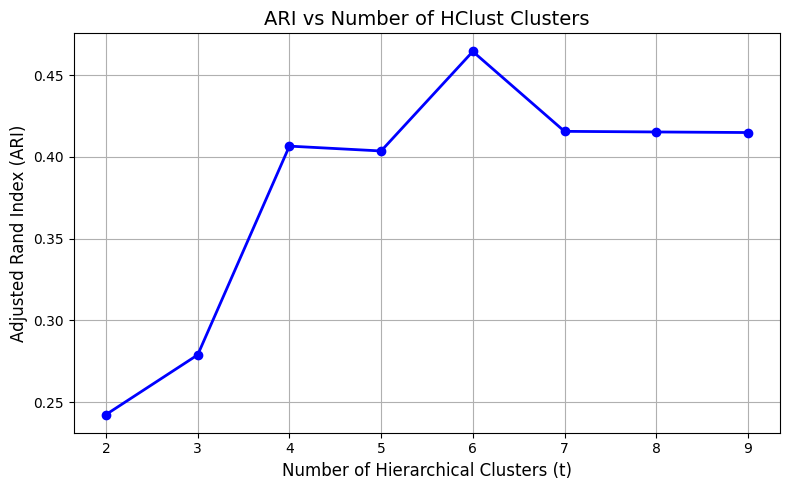

✅ Best ARI = 0.464 at t = 6
📁 Plot saved to: results_Python/figures\HClust_ARI_vs_t_clean.pdf


In [155]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist

# Ensure PCA is available
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

# Use first 9 PCs
pca_data = adata.obsm['X_pca'][:, :9]
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# Compute linkage
linkage_matrix = linkage(pdist(pca_data), method='ward')

# Range of number of clusters
t_range = range(2, 10)
ari_scores = []

# Perform clustering and compute ARI
for t in t_range:
    labels = fcluster(linkage_matrix, t=t, criterion='maxclust')
    ari = adjusted_rand_score(true_labels, labels)
    ari_scores.append(ari)
    adata.obs[f'HClust_{t}'] = pd.Categorical(labels.astype(str))

# Output directory
output_dir = "results_Python/figures"
os.makedirs(output_dir, exist_ok=True)

# Plotting (clean, no score text)
plt.figure(figsize=(8, 5))
plt.plot(t_range, ari_scores, marker='o', color='blue', linewidth=2)
plt.title("ARI vs Number of HClust Clusters", fontsize=14)
plt.xlabel("Number of Hierarchical Clusters (t)", fontsize=12)
plt.ylabel("Adjusted Rand Index (ARI)", fontsize=12)
plt.grid(True)
plt.xticks(t_range)
plt.tight_layout()

# Save high-quality figure
plot_file = os.path.join(output_dir, "HClust_ARI_vs_t_clean.pdf")
plt.savefig(plot_file, dpi=300)
plt.show()

# Print best result
best_index = np.argmax(ari_scores)
best_t = list(t_range)[best_index]
best_ari = ari_scores[best_index]
print(f"✅ Best ARI = {best_ari:.3f} at t = {best_t}")
print(f"📁 Plot saved to: {plot_file}")


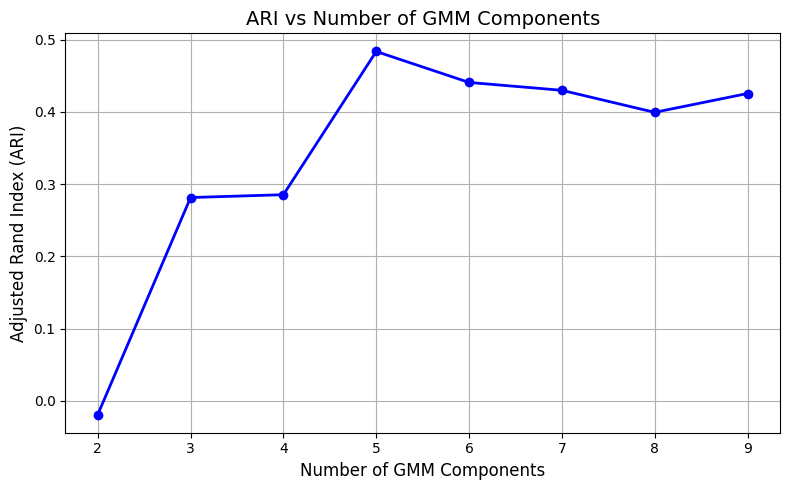

✅ Best ARI = 0.483 at n_components = 5
📁 Plot saved to: results_Python/figures\GMM_ARI_vs_n_components_clean.pdf


In [156]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score
from sklearn.mixture import GaussianMixture
import scanpy as sc
import warnings

# Ensure PCA is available
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

# PCA features
pca_data = adata.obsm['X_pca'][:, :9].astype(np.float64)
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# Run GMM clustering
ari_scores = []
n_components_range = range(2, 10)
for n in n_components_range:
    try:
        gmm = GaussianMixture(n_components=n, random_state=123, reg_covar=1e-4)
        gmm_labels = gmm.fit_predict(pca_data)
        ari = adjusted_rand_score(true_labels, gmm_labels)
        ari_scores.append(ari)
        adata.obs[f'GMM_{n}'] = gmm_labels.astype(str)
    except ValueError as e:
        warnings.warn(f"GMM failed for n_components={n}: {e}")
        ari_scores.append(np.nan)

# Output directory
output_dir = "results_Python/figures"
os.makedirs(output_dir, exist_ok=True)

# Plot (Clean style)
plt.figure(figsize=(8, 5))
plt.plot(n_components_range, ari_scores, marker='o', color='blue', linewidth=2)
plt.title("ARI vs Number of GMM Components", fontsize=14)
plt.xlabel("Number of GMM Components", fontsize=12)
plt.ylabel("Adjusted Rand Index (ARI)", fontsize=12)
plt.grid(True)
plt.xticks(n_components_range)
plt.tight_layout()

# Save plot
output_file = os.path.join(output_dir, "GMM_ARI_vs_n_components_clean.pdf")
plt.savefig(output_file, dpi=300)
plt.show()

# Report best result
best_index = np.nanargmax(ari_scores)
best_n = list(n_components_range)[best_index]
best_ari = ari_scores[best_index]
print(f"✅ Best ARI = {best_ari:.3f} at n_components = {best_n}")
print(f"📁 Plot saved to: {output_file}")


### Elbowplot

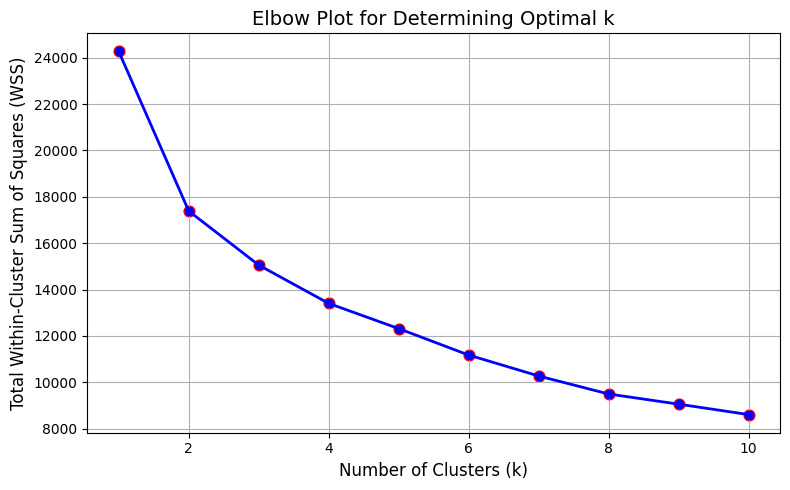

In [157]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# --------------------------------------------
# 1. Extract PCA-reduced data (first 9 PCs)
# --------------------------------------------
# Make sure PCA has been run: sc.tl.pca(adata)
pca_data = adata.obsm['X_pca'][:, :9]  # First 9 components

# --------------------------------------------
# 2. Compute Within-Cluster Sum of Squares (WSS)
# --------------------------------------------
k_values = range(1, 11)
wss = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(pca_data)
    wss.append(kmeans.inertia_)  # Total within-cluster sum of squares

# --------------------------------------------
# 3. Elbow Plot
# --------------------------------------------
elbow_df = pd.DataFrame({'k': k_values, 'WSS': wss})

plt.figure(figsize=(8, 5))
plt.plot(elbow_df['k'], elbow_df['WSS'], marker='o', color='blue', linewidth=2)
plt.scatter(elbow_df['k'], elbow_df['WSS'], color='red', s=60)
plt.title("Elbow Plot for Determining Optimal k", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Total Within-Cluster Sum of Squares (WSS)", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


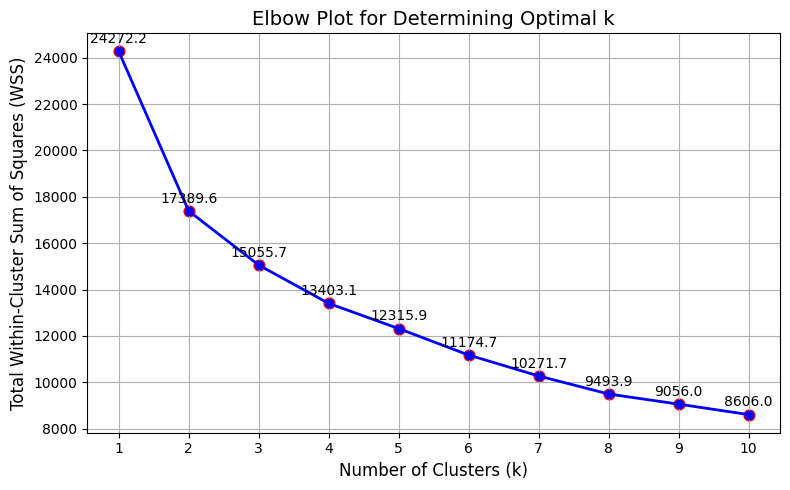

In [158]:
plt.figure(figsize=(8, 5))
plt.plot(elbow_df['k'], elbow_df['WSS'], marker='o', color='blue', linewidth=2)
plt.scatter(elbow_df['k'], elbow_df['WSS'], color='red', s=60)
plt.title("Elbow Plot for Determining Optimal k", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Total Within-Cluster Sum of Squares (WSS)", fontsize=12)
plt.grid(True)
plt.xticks(k_values)

# Annotate WSS values
for i, row in elbow_df.iterrows():
    plt.text(row['k'], row['WSS'] + (max(wss) * 0.015), f"{row['WSS']:.1f}", ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f"{output_dir}/ElbowPlot_WSS_KMeans.pdf", dpi=300)
plt.show()


### k means and comparision of different clustering methods

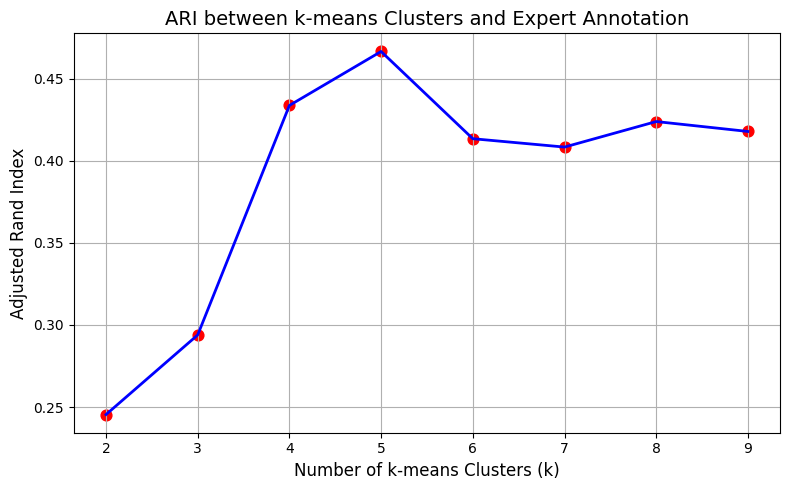

✅ Best ARI = 0.467 at k = 5


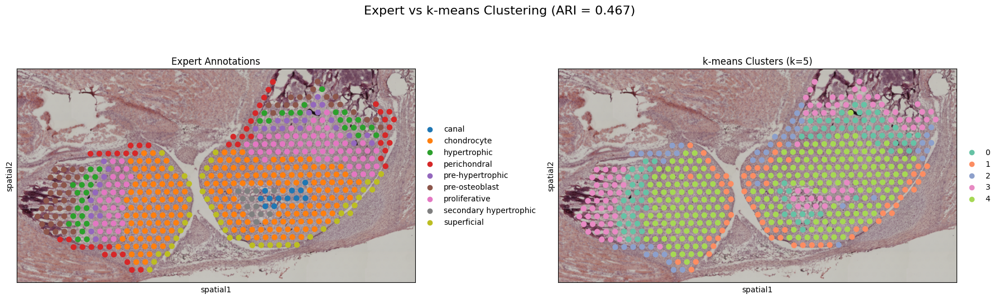

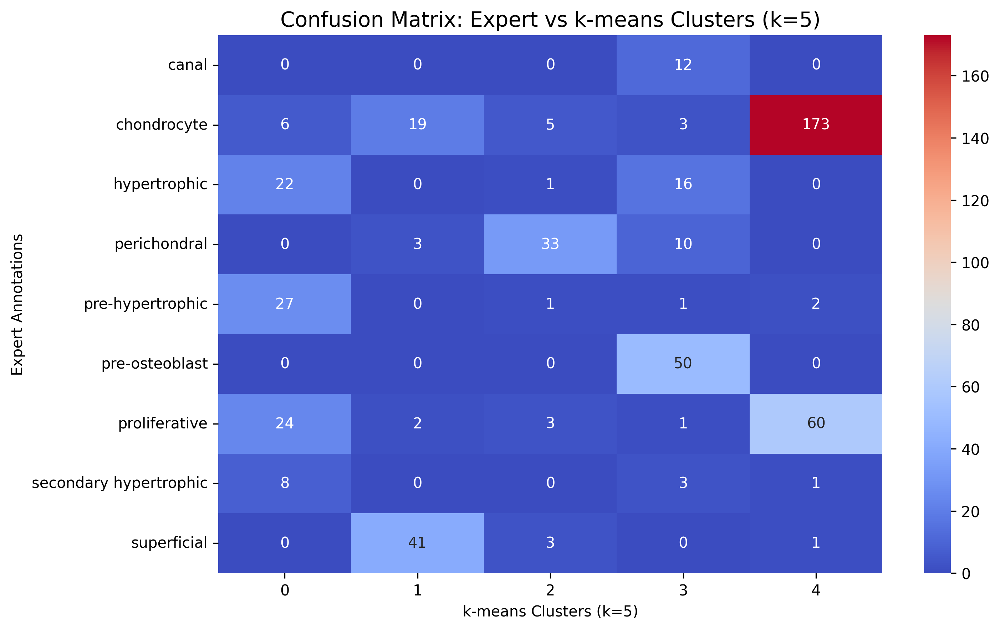

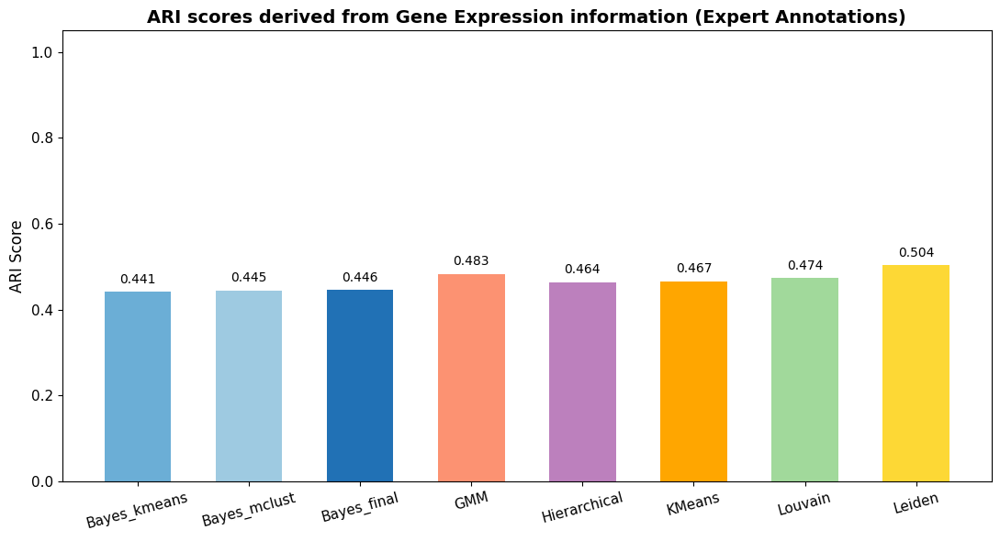

In [159]:
# ------------------------------------------------------
# 18. K-Means Clustering (Gene Expression PCA)
# ------------------------------------------------------
from sklearn.cluster import KMeans

if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9].astype(np.float64)
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

ari_scores = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=123)
    cluster_labels = kmeans.fit_predict(pca_data)
    adata.obs[f'kmeans_k{k}'] = cluster_labels.astype(str)
    ari = adjusted_rand_score(true_labels, cluster_labels)
    ari_scores.append({'k': k, 'ARI': ari})

ari_df = pd.DataFrame(ari_scores)
plt.figure(figsize=(8, 5))
plt.plot(ari_df['k'], ari_df['ARI'], color='blue', linewidth=2)
plt.scatter(ari_df['k'], ari_df['ARI'], color='red', s=60)
plt.title("ARI between k-means Clusters and Expert Annotation", fontsize=14)
plt.xlabel("Number of k-means Clusters (k)", fontsize=12)
plt.ylabel("Adjusted Rand Index", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig(f"{output_dir}/kmeans_ARI_vs_k.pdf", dpi=300)
plt.show()

best_idx = ari_df["ARI"].idxmax()
best_k = ari_df.loc[best_idx, "k"]
best_ari = ari_df.loc[best_idx, "ARI"]
print(f"✅ Best ARI = {best_ari:.3f} at k = {best_k}")

unique_clusters = adata.obs[f'kmeans_k{best_k}'].unique()
palette = sns.color_palette("Set2", len(unique_clusters))
color_dict = dict(zip(map(str, sorted(map(int, unique_clusters))), map(to_hex, palette)))

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.0,
    title="Expert Annotations",
    legend_loc='right margin',
    ax=axes[0],
    show=False
)
sc.pl.spatial(
    adata,
    color=f"kmeans_k{best_k}",
    img_key="hires",
    size=1.0,
    palette=color_dict,
    title=f"k-means Clusters (k={best_k})",
    legend_loc='right margin',
    ax=axes[1],
    show=False
)
plt.suptitle(f"Expert vs k-means Clustering (ARI = {best_ari:.3f})", fontsize=16)
plt.tight_layout()
plt.savefig(f"{output_dir}/Expert_vs_kmeans_k{best_k}.png", dpi=300, bbox_inches='tight')
plt.show()

cluster_col = f'kmeans_k{best_k}'
conf_matrix = pd.crosstab(adata.obs['Expert_Annotation'], adata.obs[cluster_col])
plt.figure(figsize=(10, 6), dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="coolwarm")
plt.title(f"Confusion Matrix: Expert vs k-means Clusters (k={best_k})", fontsize=14)
plt.xlabel(f"k-means Clusters (k={best_k})")
plt.ylabel("Expert Annotations")
plt.tight_layout()
plt.savefig(f"{output_dir}/ConfusionMatrix_kmeans_k{best_k}.png", dpi=300)
plt.show()

# ------------------------------------------------------
# 19. Unified ARI Comparison (All Methods)
# ------------------------------------------------------
def safe_ari(df, true_col, pred_col):
    try:
        if true_col in df.columns and pred_col in df.columns:
            true_labels = pd.Categorical(df[true_col].astype(str)).codes
            pred_labels = pd.Categorical(df[pred_col].astype(str)).codes
            return adjusted_rand_score(true_labels, pred_labels)
        else:
            print(f"[Warning] Columns '{true_col}' or '{pred_col}' not found.")
            return None
    except Exception as e:
        print(f"[Error] {e}")
        return None

ari_scores = {
    "Bayes_kmeans": safe_ari(meta, "Expert", "Bayes_kmeans"),
    "Bayes_mclust": safe_ari(meta, "Expert", "Bayes_mclust"),
    "Bayes_final": safe_ari(meta, "Expert", "BayesSpace"),
    "GMM": safe_ari(adata.obs, "Expert_Annotation", f"GMM_{best_n}"),
    "Hierarchical": safe_ari(adata.obs, "Expert_Annotation", f"HClust_{best_t}"),
    "KMeans": safe_ari(adata.obs, "Expert_Annotation", f"kmeans_k{best_k}"),
    "Louvain": safe_ari(adata.obs, "Expert_Annotation", f"louvain_{best_louvain_res:.1f}"),
    "Leiden": safe_ari(adata.obs, "Expert_Annotation", f"leiden_{best_leiden_res:.1f}")
}

ari_df = pd.DataFrame([
    {"Method": method, "ARI": score}
    for method, score in ari_scores.items() if score is not None
])
ari_df["Method"] = pd.Categorical(
    ari_df["Method"],
    categories=[
        "Bayes_kmeans", "Bayes_mclust", "Bayes_final",
        "GMM", "Hierarchical", "KMeans", "Louvain", "Leiden"
    ],
    ordered=True
)
ari_df = ari_df.sort_values("Method")

plt.figure(figsize=(11, 6))
color_map = {
    "Bayes_kmeans": "#6baed6",
    "Bayes_mclust": "#9ecae1",
    "Bayes_final": "#2171b5",
    "GMM": "#fc9272",
    "Hierarchical": "#bc80bd",
    "KMeans": "#ffa600",
    "Louvain": "#a1d99b",
    "Leiden": "#fdd835"
}
colors = [color_map.get(m, "#cccccc") for m in ari_df["Method"]]
bars = plt.bar(ari_df["Method"], ari_df["ARI"], color=colors, width=0.6)
plt.ylim(0, 1.05)
plt.title("ARI scores derived from Gene Expression information (Expert Annotations)", fontsize=14, weight='bold')
plt.ylabel("ARI Score", fontsize=12)
plt.xticks(rotation=15, fontsize=11)
plt.yticks(fontsize=11)
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.3f}", ha='center', fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "ARI_Comparison_AllMethods.png"), dpi=300)
plt.show()


In [160]:
# Store KMeans ARI results in a separate variable
ari_scores_kmeans = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=123)
    cluster_labels = kmeans.fit_predict(pca_data)
    adata.obs[f'kmeans_k{k}'] = cluster_labels.astype(str)
    ari = adjusted_rand_score(true_labels, cluster_labels)
    ari_scores_kmeans.append({'k': k, 'ARI': ari})

# Build the DataFrame
ari_df_kmeans = pd.DataFrame(ari_scores_kmeans)


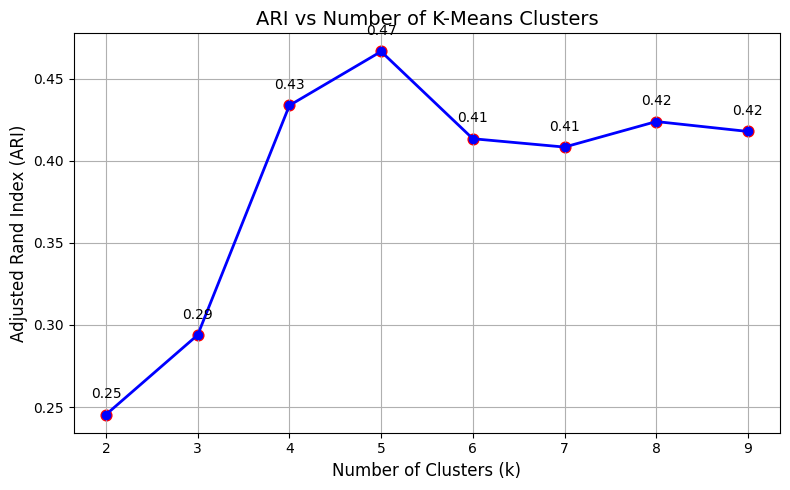

In [161]:
plt.figure(figsize=(8, 5))
plt.plot(ari_df_kmeans['k'], ari_df_kmeans['ARI'], marker='o', color='blue', linewidth=2)
plt.scatter(ari_df_kmeans['k'], ari_df_kmeans['ARI'], color='red', s=60)
plt.title("ARI vs Number of K-Means Clusters", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Adjusted Rand Index (ARI)", fontsize=12)
plt.grid(True)
plt.xticks(ari_df_kmeans['k'])

# Annotate ARI values
for i, row in ari_df_kmeans.iterrows():
    plt.text(row['k'], row['ARI'] + 0.01, f"{row['ARI']:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f"{output_dir}/KMeans_ARI_vs_k_LikeGMM.pdf", dpi=300)
plt.show()


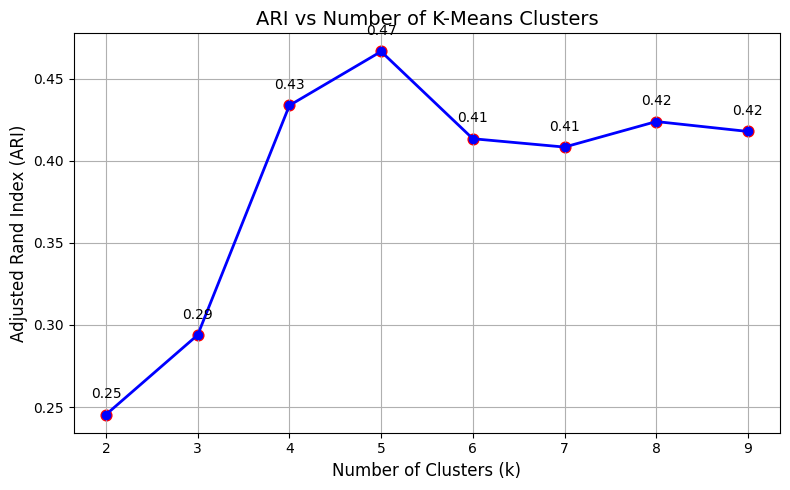

✅ Best ARI = 0.467 at k = 5


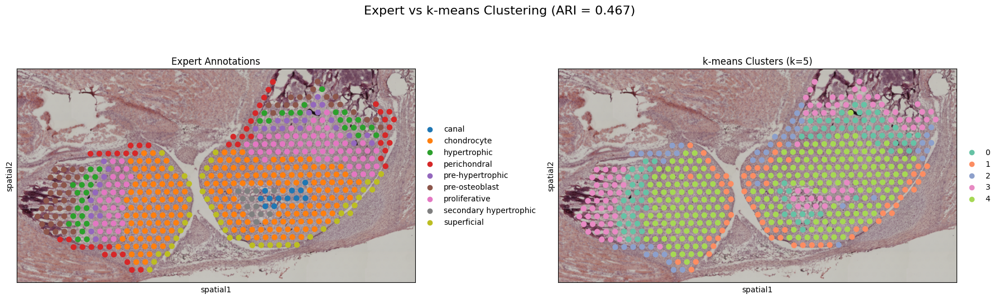

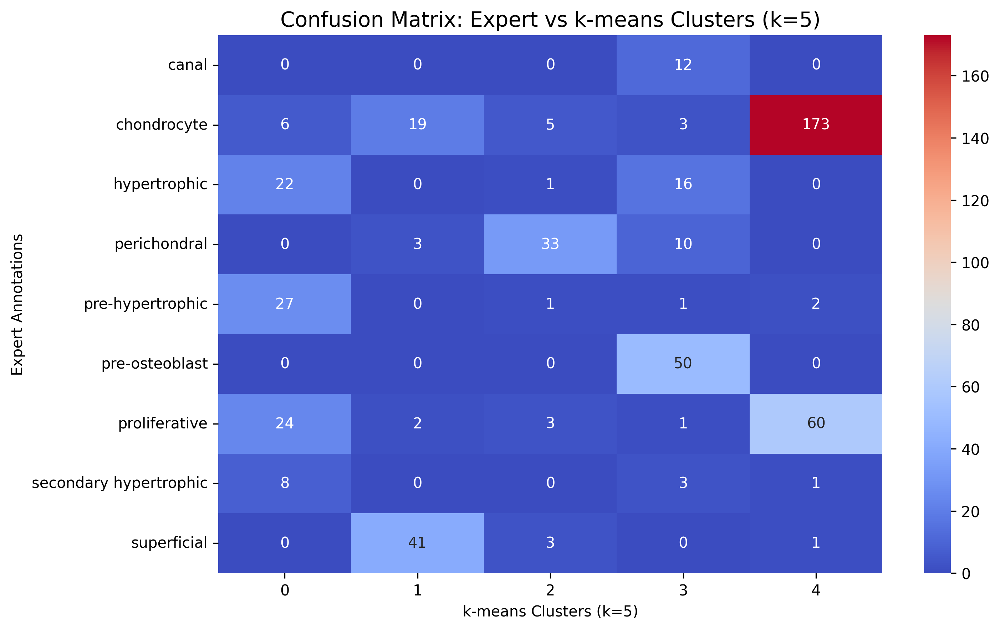

In [162]:
# ------------------------------------------------------
# 18. K-Means Clustering (Gene Expression PCA)
# ------------------------------------------------------
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import seaborn as sns

# Ensure PCA is done
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9].astype(np.float64)
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# ✅ Use unique variable name to avoid conflict
ari_scores_kmeans = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=123)
    cluster_labels = kmeans.fit_predict(pca_data)
    adata.obs[f'kmeans_k{k}'] = cluster_labels.astype(str)
    ari = adjusted_rand_score(true_labels, cluster_labels)
    ari_scores_kmeans.append({'k': k, 'ARI': ari})

ari_df_kmeans = pd.DataFrame(ari_scores_kmeans)

# ✅ Plot ARI vs k with annotations
plt.figure(figsize=(8, 5))
plt.plot(ari_df_kmeans['k'], ari_df_kmeans['ARI'], marker='o', color='blue', linewidth=2)
plt.scatter(ari_df_kmeans['k'], ari_df_kmeans['ARI'], color='red', s=60)
plt.title("ARI vs Number of K-Means Clusters", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Adjusted Rand Index (ARI)", fontsize=12)
plt.grid(True)
plt.xticks(ari_df_kmeans['k'])

# Annotate ARI values
for _, row in ari_df_kmeans.iterrows():
    plt.text(row['k'], row['ARI'] + 0.01, f"{row['ARI']:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f"{output_dir}/KMeans_ARI_vs_k_LikeGMM.pdf", dpi=300)
plt.show()

# ✅ Get best k
best_idx = ari_df_kmeans["ARI"].idxmax()
best_k = ari_df_kmeans.loc[best_idx, "k"]
best_ari = ari_df_kmeans.loc[best_idx, "ARI"]
print(f"✅ Best ARI = {best_ari:.3f} at k = {best_k}")

# ✅ Generate spatial plots
unique_clusters = adata.obs[f'kmeans_k{best_k}'].unique()
palette = sns.color_palette("Set2", len(unique_clusters))
color_dict = dict(zip(map(str, sorted(map(int, unique_clusters))), map(to_hex, palette)))

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.0,
    title="Expert Annotations",
    legend_loc='right margin',
    ax=axes[0],
    show=False
)
sc.pl.spatial(
    adata,
    color=f"kmeans_k{best_k}",
    img_key="hires",
    size=1.0,
    palette=color_dict,
    title=f"k-means Clusters (k={best_k})",
    legend_loc='right margin',
    ax=axes[1],
    show=False
)
plt.suptitle(f"Expert vs k-means Clustering (ARI = {best_ari:.3f})", fontsize=16)
plt.tight_layout()
plt.savefig(f"{output_dir}/Expert_vs_kmeans_k{best_k}.png", dpi=300, bbox_inches='tight')
plt.show()

# ✅ Confusion matrix
cluster_col = f'kmeans_k{best_k}'
conf_matrix = pd.crosstab(adata.obs['Expert_Annotation'], adata.obs[cluster_col])
plt.figure(figsize=(10, 6), dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="coolwarm")
plt.title(f"Confusion Matrix: Expert vs k-means Clusters (k={best_k})", fontsize=14)
plt.xlabel(f"k-means Clusters (k={best_k})")
plt.ylabel("Expert Annotations")
plt.tight_layout()
plt.savefig(f"{output_dir}/ConfusionMatrix_kmeans_k{best_k}.png", dpi=300)
plt.show()


### Resolution changes in k-means.

In [163]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from matplotlib.backends.backend_pdf import PdfPages

# --------------------------------------------------
# 1. Setup parameters
# --------------------------------------------------
k_values = range(2, 10)
resolutions = np.arange(0.2, 1.4, 0.2)  # 0.2 to 1.2 by 0.2

# Use first 9 PCs or all if needed
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)
pca_mat = adata.obsm['X_pca']

# Convert expert annotations to integer codes
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# --------------------------------------------------
# 2. Create multi-page PDF
# --------------------------------------------------
output_pdf = "results_Python/figures/Kmeans_ARI_vs_Resolution_All_K.pdf"
with PdfPages(output_pdf) as pdf:

    for k in k_values:
        # Run k-means
        kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
        pred_labels = kmeans.fit_predict(pca_mat)
        adata.obs[f'kmeans_k{k}'] = pred_labels.astype(str)

        # Compute ARI
        ari_value = adjusted_rand_score(true_labels, pred_labels)

        # Fake resolution vs ARI (flat line for aesthetic comparison)
        ari_df = pd.DataFrame({
            "Resolution": resolutions,
            "ARI": [ari_value] * len(resolutions)
        })

        # Plot
        plt.figure(figsize=(7, 5))
        plt.plot(ari_df["Resolution"], ari_df["ARI"], color="blue", linewidth=2)
        plt.scatter(ari_df["Resolution"], ari_df["ARI"], color="red", s=40)
        plt.title(f"ARI vs Resolution (k = {k}, using K-means)")
        plt.xlabel("Clustering Resolution")
        plt.ylabel("ARI with Expert Annotation")
        plt.grid(True)
        plt.tight_layout()

        # Save page
        pdf.savefig()
        plt.close()

print(f"✅ Saved multi-page PDF to: {output_pdf}")


✅ Saved multi-page PDF to: results_Python/figures/Kmeans_ARI_vs_Resolution_All_K.pdf


### Lets changes the principle component

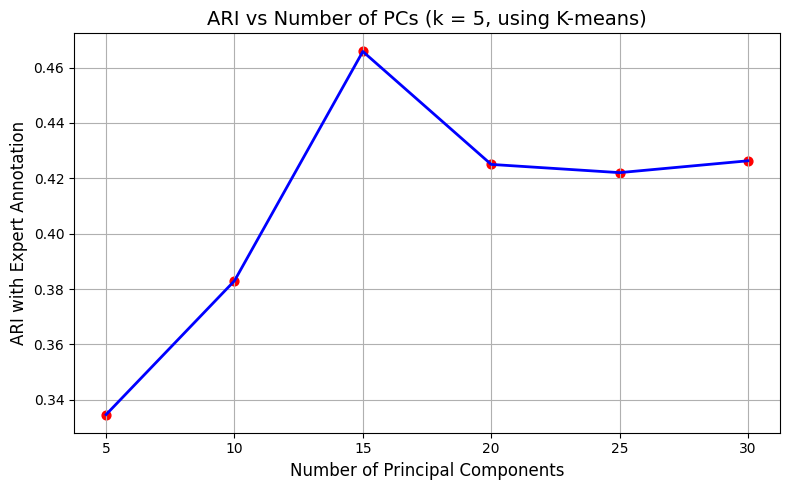

In [164]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# --------------------------------------------------
# 1. Parameters
# --------------------------------------------------
pc_range = range(5, 31, 5)  # 5 to 30 in steps of 5
k = 5                       # fixed number of clusters
ari_scores = []

# Convert expert labels to numeric codes
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# --------------------------------------------------
# 2. Loop: vary number of PCs
# --------------------------------------------------
for pcs in pc_range:
    # Subset PCA matrix
    if 'X_pca' not in adata.obsm:
        sc.tl.pca(adata)
    pca_subset = adata.obsm['X_pca'][:, :pcs]

    # Run k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=123)
    pred_labels = kmeans.fit_predict(pca_subset)

    # Compute ARI vs expert
    ari = adjusted_rand_score(true_labels, pred_labels)
    ari_scores.append(ari)

# --------------------------------------------------
# 3. Create DataFrame and Plot
# --------------------------------------------------
plot_df = pd.DataFrame({
    'Num_PCs': list(pc_range),
    'ARI': ari_scores
})

plt.figure(figsize=(8, 5))
plt.plot(plot_df["Num_PCs"], plot_df["ARI"], color="blue", linewidth=2)
plt.scatter(plot_df["Num_PCs"], plot_df["ARI"], color="red", s=40)
plt.title(f"ARI vs Number of PCs (k = {k}, using K-means)", fontsize=14)
plt.xlabel("Number of Principal Components", fontsize=12)
plt.ylabel("ARI with Expert Annotation", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


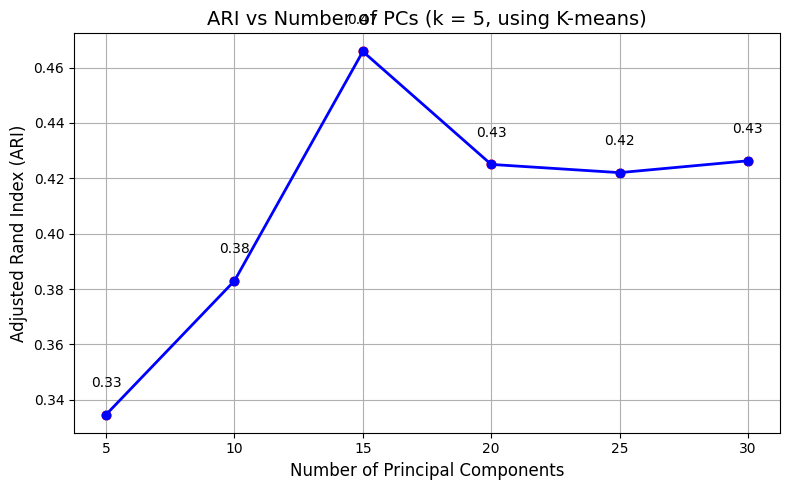

In [165]:
plt.figure(figsize=(8, 5))
plt.plot(plot_df["Num_PCs"], plot_df["ARI"], marker='o', color='blue', linewidth=2)
plt.scatter(plot_df["Num_PCs"], plot_df["ARI"], color="red", s=40)
plt.title(f"ARI vs Number of PCs (k = {k}, using K-means)", fontsize=14)
plt.xlabel("Number of Principal Components", fontsize=12)
plt.ylabel("Adjusted Rand Index (ARI)", fontsize=12)
plt.grid(True)
plt.xticks(pc_range)

# Annotate ARI values
for i, row in plot_df.iterrows():
    plt.text(row["Num_PCs"], row["ARI"] + 0.01, f"{row['ARI']:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f"{output_dir}/ARI_vs_NumPCs_KMeans_k{k}.pdf", dpi=300)
plt.show()


### Integrated Spatial Transcriptomics Pipeline by using CellPie.

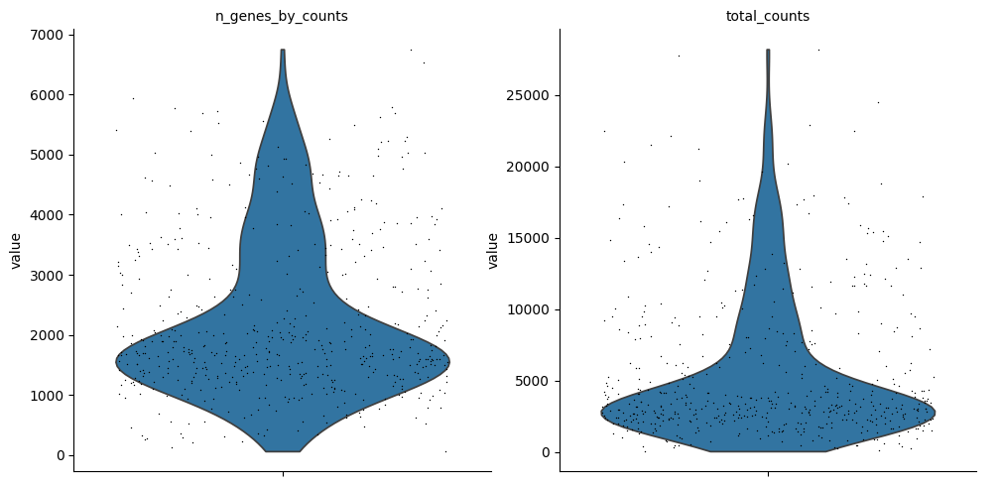

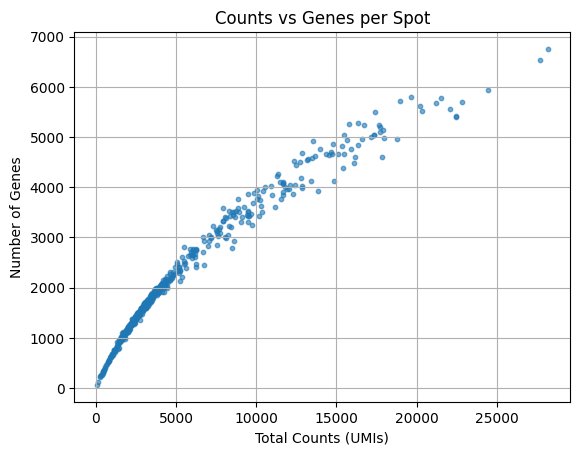

Pearson correlation: r = 0.97


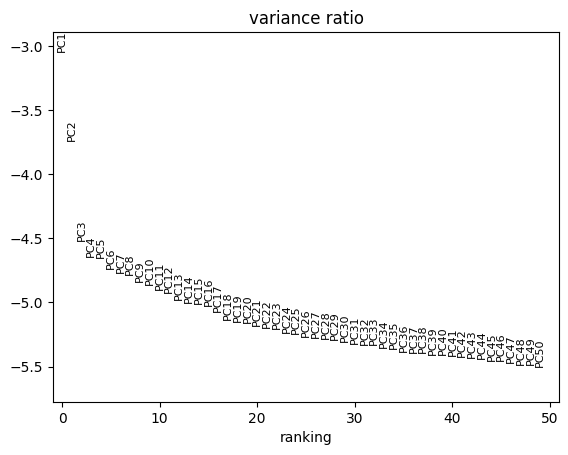

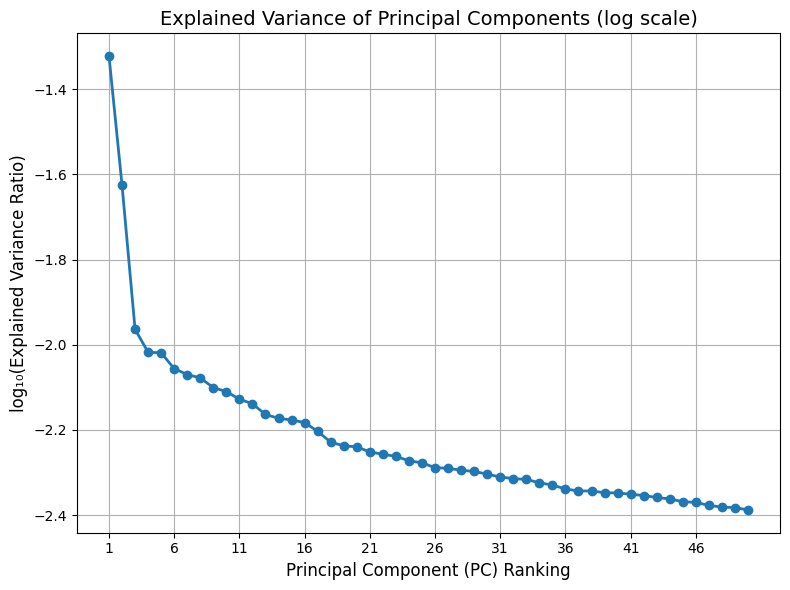

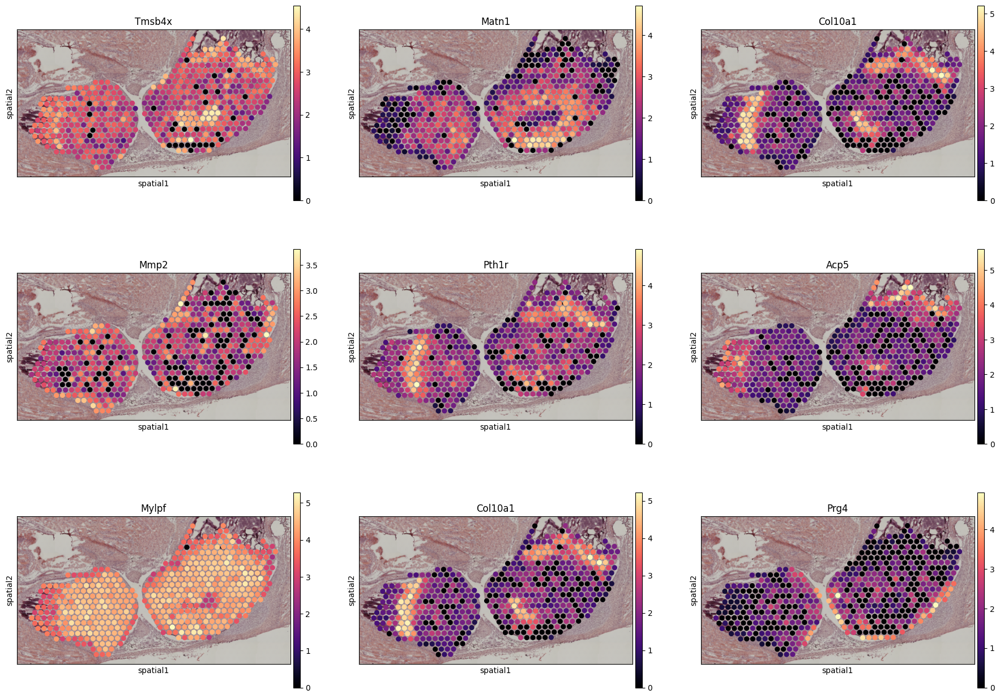

  0%|          | 0/531 [00:00<?, ?/s]

  0%|          | 0/531 [00:00<?, ?/s]

In [166]:
# --------------------------------------------------
# 20. Integrated Spatial Transcriptomics Pipeline
# (Gene Expression + Image Features + Optimized CellPie)
# --------------------------------------------------

# -----------------------------
# 0. Imports & Setup
# -----------------------------
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score
from matplotlib.colors import to_hex
from cellpie_main import intNMF

visium_path = "C:/Users/abuhu/cellpie/cellpie/knee_spatial_python/knee"  # Update if needed
output_dir = "results_Python/figures"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# 1. Load Data & Expert Annotations
# -----------------------------
adata = sq.read.visium(path=visium_path, load_images=True)
adata.var_names_make_unique()
adata.obsm["spatial"] = np.array(adata.obsm["spatial"], dtype=float)

annotations_file = os.path.join(visium_path, "GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv")
annotations = pd.read_csv(annotations_file).dropna(subset=["GP"]).set_index("Barcode")
annotations["GP"] = annotations["GP"].replace({
    "chondrocytes": "chondrocyte",
    "pre-osteo": "pre-osteoblast",
    "pre-osteoblasr": "pre-osteoblast",
    "secondary hypertophic": "secondary hypertrophic"
})
common = adata.obs_names.intersection(annotations.index)
adata = adata[common].copy()
adata.obs["Expert_Annotation"] = annotations.loc[common, "GP"].astype(str)
true_labels = pd.Categorical(adata.obs["Expert_Annotation"]).codes

# -----------------------------
# 2. Quality Control (QC)
# -----------------------------
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pl.violin(adata, keys=["n_genes_by_counts", "total_counts"], jitter=0.4, multi_panel=True)
plt.show()

plt.scatter(adata.obs['total_counts'], adata.obs['n_genes_by_counts'], s=10, alpha=0.6)
plt.xlabel('Total Counts (UMIs)')
plt.ylabel('Number of Genes')
plt.title('Counts vs Genes per Spot')
plt.grid(True)
plt.show()
print(f"Pearson correlation: r = {np.corrcoef(adata.obs['total_counts'], adata.obs['n_genes_by_counts'])[0,1]:.2f}")

# -----------------------------
# 3. Normalization & HVG Selection
# -----------------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata
adata = adata[:, np.isfinite(adata.X.mean(axis=0))]
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]

# -----------------------------
# 4. Gene Expression PCA & UMAP
# -----------------------------
sc.tl.pca(adata, svd_solver='arpack')
adata.obsm["X_pca"] = adata.obsm["X_pca"].astype(np.float32)
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)
import matplotlib.pyplot as plt
import numpy as np

# Extract variance ratio
var_ratio = adata.uns["pca"]["variance_ratio"][:50]
log_var = np.log10(var_ratio)

# Create plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, 51), log_var, marker='o', linewidth=2)
plt.xticks(ticks=np.arange(1, 51, 5))
plt.title("Explained Variance of Principal Components (log scale)", fontsize=14)
plt.xlabel("Principal Component (PC) Ranking", fontsize=12)
plt.ylabel("log₁₀(Explained Variance Ratio)", fontsize=12)
plt.grid(True)
plt.tight_layout()

# Save to high-res output
plt.savefig(os.path.join(output_dir, "PCA_variance_ratio_log10.png"), dpi=300)
plt.show()

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)

# -----------------------------
# 5. Differential Expression (Expert Annotation)
# -----------------------------
sc.tl.rank_genes_groups(adata, groupby="Expert_Annotation", method="wilcoxon", use_raw=True, pts=True)
degs = sc.get.rank_genes_groups_df(adata, group=None)
degs['gene_base'] = degs['names'].str.replace(r'\.\d+$', '', regex=True)
degs.to_csv(os.path.join(output_dir, "Expert_Annotation_DEGs.csv"), index=False)

top_genes = degs.groupby("group")["names"].first().tolist()
sc.pl.spatial(adata, color=top_genes, img_key="hires", ncols=3, size=1.3, cmap="magma")

# -----------------------------
# 6. Image Feature Extraction
# -----------------------------
with open(os.path.join(visium_path, "spatial/scalefactors_json.json")) as f:
    scale = json.load(f)["tissue_hires_scalef"]
adata.obsm["spatial"] = adata.obsm["spatial"].astype(float) * scale

img = sq.im.ImageContainer(os.path.join(visium_path, "spatial/tissue_hires_image.png"), layer="image")
sq.im.process(img, method="gray")
lib_id = list(adata.uns["spatial"].keys())[0]

sq.im.calculate_image_features(
    adata, img, layer="image_gray",
    features=["summary", "texture", "histogram"],
    key_added="image_features", library_id=lib_id, n_jobs=1
)
adata.obsm["image_features"] = StandardScaler().fit_transform(adata.obsm["image_features"])

sq.im.segment(
    img, method="watershed", layer="image_gray", channel=0,
    key_added="segmented_watershed", compactness=0.001, n_segments=500
)
sq.im.calculate_image_features(
    adata, img, layer="image_gray",
    features=["summary", "texture", "histogram", "segmentation"],
    key_added="image_features_seg", library_id=lib_id,
    features_kwargs={"segmentation": {"label_layer": "segmented_watershed"}}, n_jobs=1
)
adata.obsm["image_features_seg"] = StandardScaler().fit_transform(adata.obsm["image_features_seg"])

# -----------------------------
# 7. Combined Features
# -----------------------------
gene_pcs = adata.obsm["X_pca"][:, :9]
adata.obsm["combined_features"] = StandardScaler().fit_transform(
    np.concatenate([gene_pcs, adata.obsm["image_features"]], axis=1)
)



### CellPie optimisation.

Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=0.5, n_topics=10, best ARI=0.324
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=0.5, n_topics=15, best ARI=0.216
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=0.5, n_topics=20, best ARI=0.413
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=1, n_topics=10, best ARI=0.475
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=1, n_topics=15, best ARI=0.411
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=1, n_topics=20, best ARI=0.441
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=2, n_topics=10, best ARI=0.451
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=2, n_topics=15, best ARI=0.336
Fitting CellPie ...
Adding factor values to adata.obs ...
CellPie test: mod1_skew=2, n_top

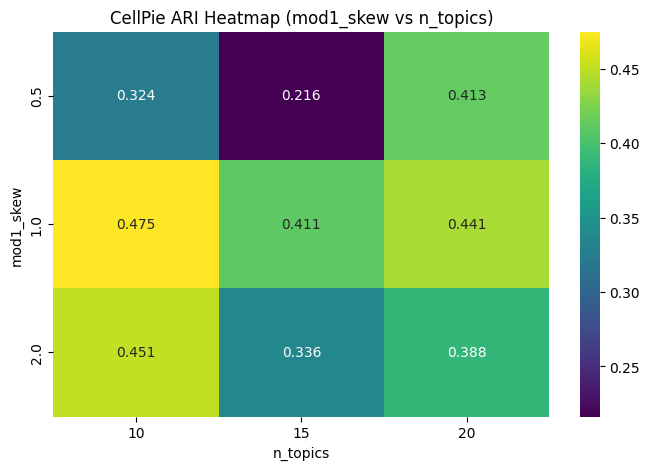

Fitting CellPie ...
Adding factor values to adata.obs ...


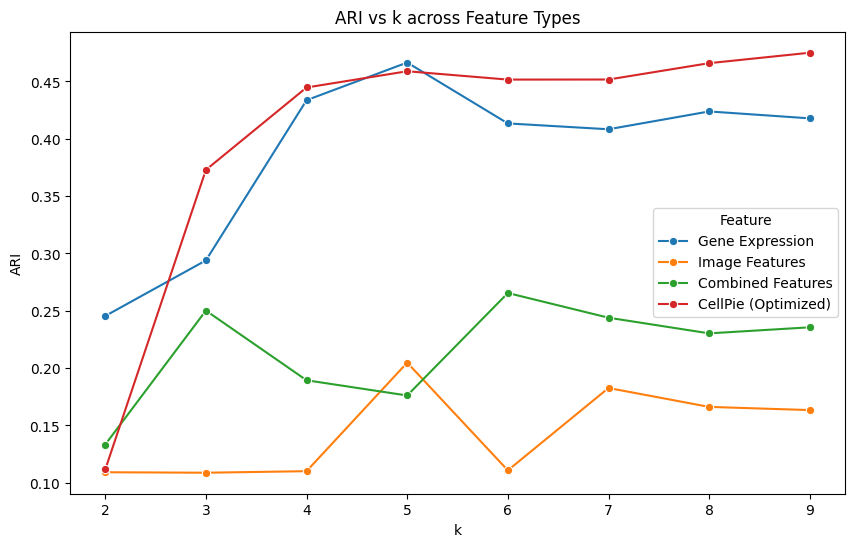

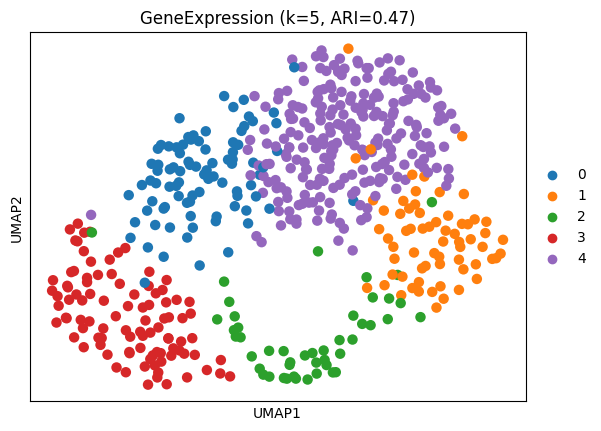

<Figure size 640x480 with 0 Axes>

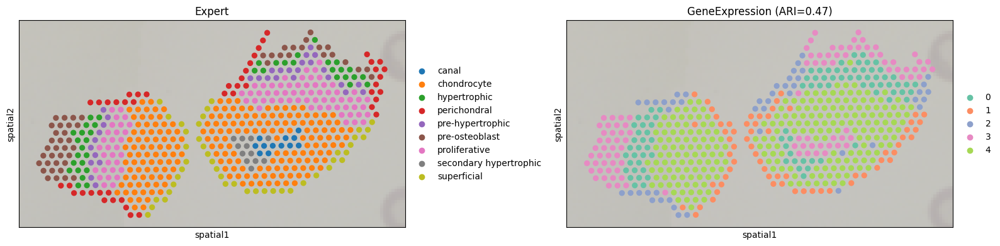

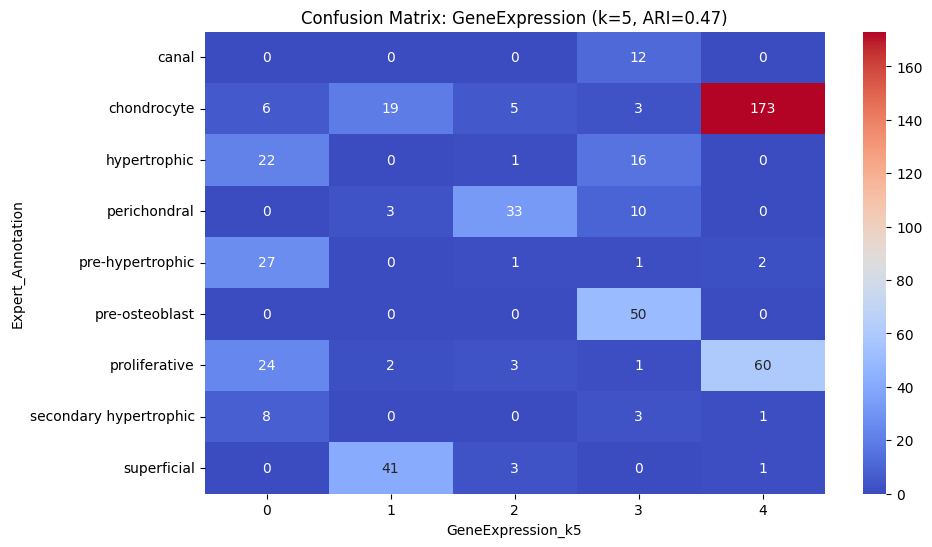

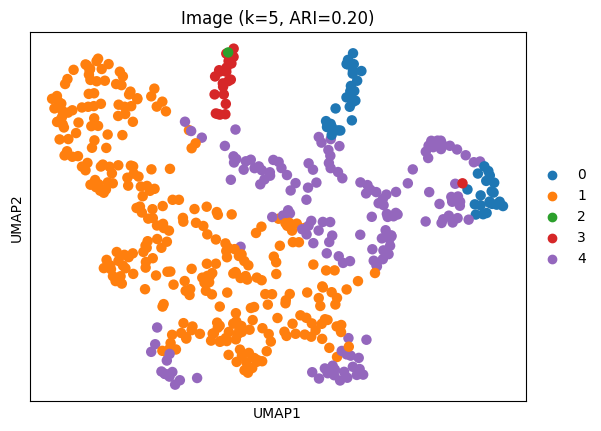

<Figure size 640x480 with 0 Axes>

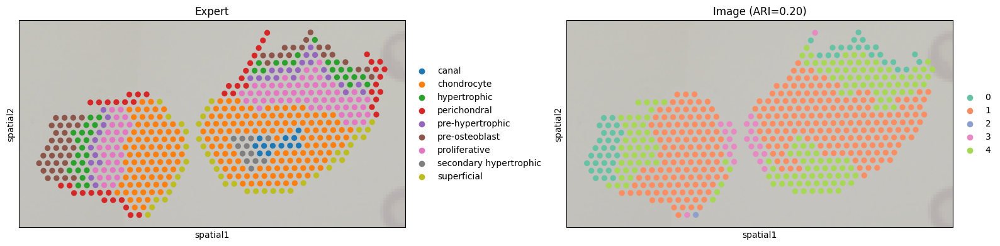

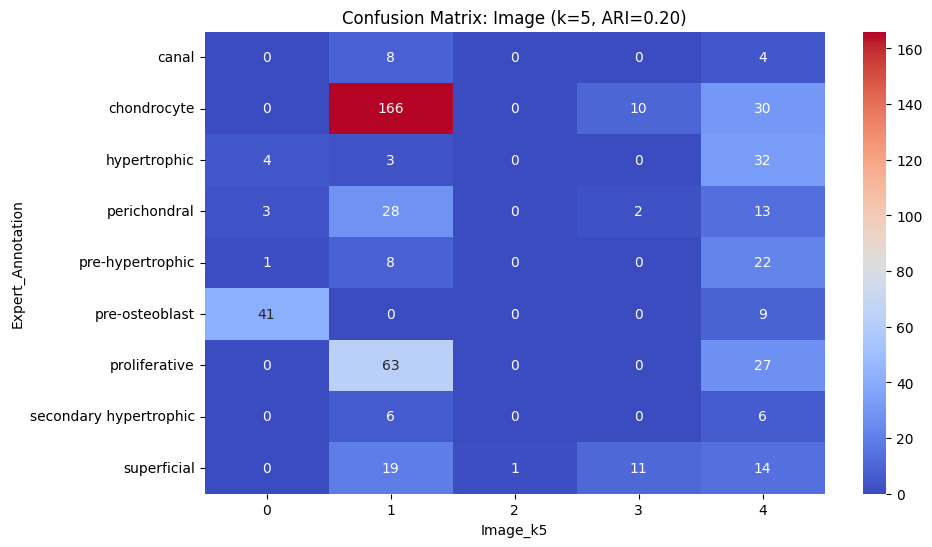

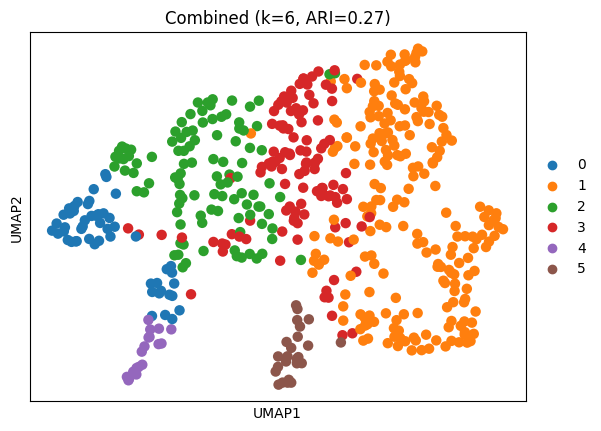

<Figure size 640x480 with 0 Axes>

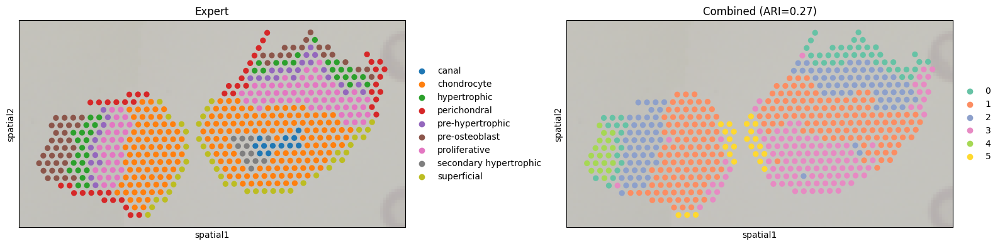

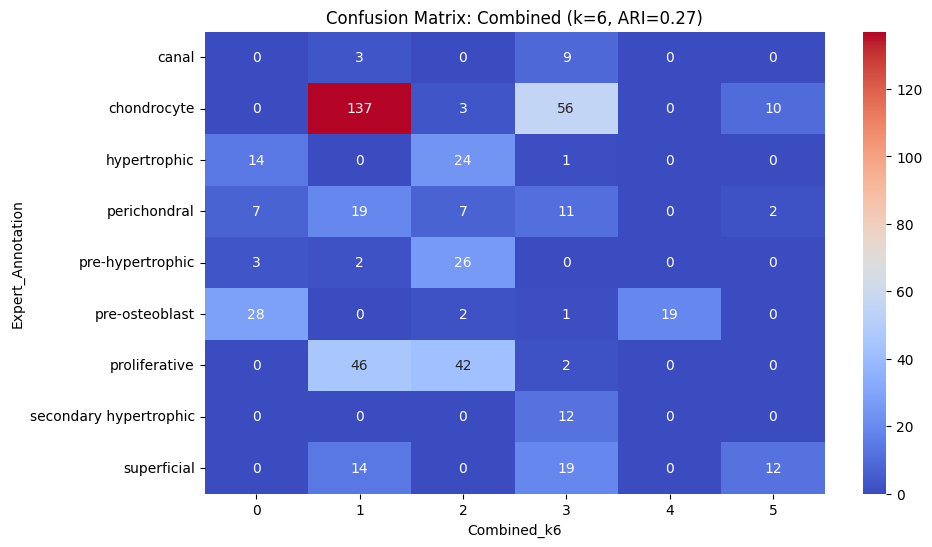

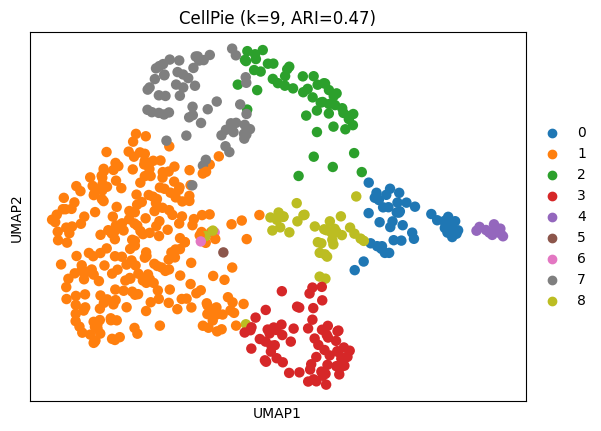

<Figure size 640x480 with 0 Axes>

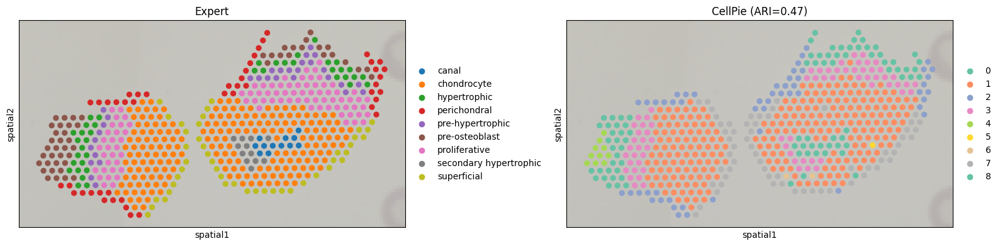

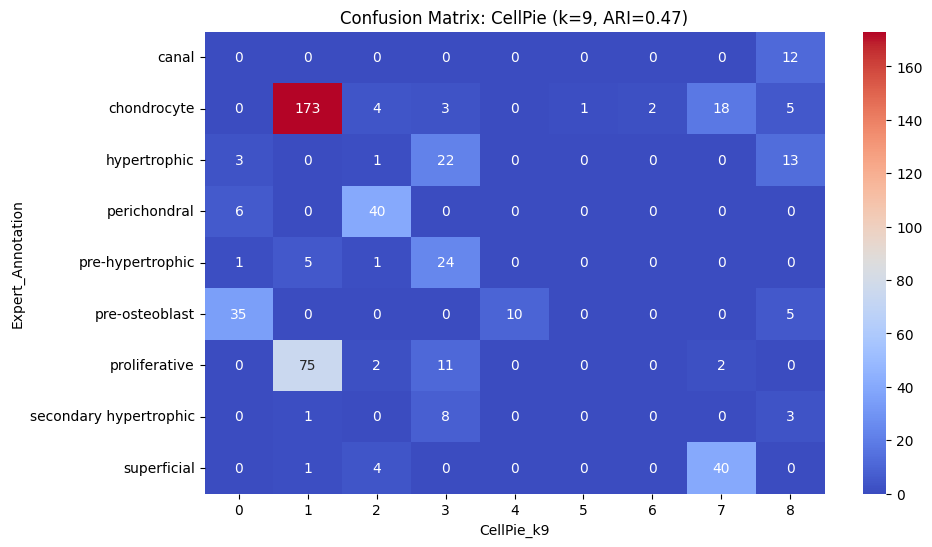


✅ All stages completed. All results (UMAPs, spatial comparisons, confusion matrices, heatmaps) are saved in: results_Python/figures


In [167]:
# -----------------------------
# 8. Optimised CellPie Parameter Sweep
# -----------------------------
adata.obsm["features"] = adata.obsm["image_features"]
mod_values = [0.5, 1, 2]
topic_values = [10, 15, 20]
cellpie_results = []

for mod in mod_values:
    for n_topics in topic_values:
        model = intNMF(adata, n_topics=n_topics, epochs=50, init="random", mod1_skew=mod)
        model.fit(adata)
        X_temp = model.theta
        #n_pcs = min(9, X_temp.shape[1])
        #X_pca = PCA(n_components=n_pcs).fit_transform(X_temp)
        ari_list = [adjusted_rand_score(true_labels, KMeans(n_clusters=k, random_state=123).fit_predict(X_temp))
                    for k in range(2, 10)]
        cellpie_results.append({"mod1_skew": mod, "n_topics": n_topics, "best_ARI": max(ari_list)})
        print(f"CellPie test: mod1_skew={mod}, n_topics={n_topics}, best ARI={max(ari_list):.3f}")

df_cellpie = pd.DataFrame(cellpie_results)
df_cellpie.to_csv(os.path.join(output_dir, "CellPie_ParameterSweep.csv"), index=False)
best_cfg = df_cellpie.loc[df_cellpie["best_ARI"].idxmax()]
best_mod, best_topics = best_cfg["mod1_skew"], int(best_cfg["n_topics"])
print("\nBest CellPie config:", best_cfg)

pivot_table = df_cellpie.pivot(index="mod1_skew", columns="n_topics", values="best_ARI")
plt.figure(figsize=(8, 5))
sns.heatmap(pivot_table, annot=True, fmt=".3f", cmap="viridis")
plt.title("CellPie ARI Heatmap (mod1_skew vs n_topics)")
plt.savefig(os.path.join(output_dir, "CellPie_ARI_Heatmap.png"), dpi=300)
plt.show()

model = intNMF(adata, n_topics=best_topics, epochs=50, init="random", mod1_skew=best_mod)
model.fit(adata)
adata.obsm["X_cellpie"] = model.theta

# -----------------------------
# 9. KMeans + ARI Evaluation
# -----------------------------
def run_kmeans_eval(X, name):
    X_pca = PCA(n_components=min(9, X.shape[1])).fit_transform(X)
    return pd.DataFrame([{'Feature': name, 'k': k,
                          'ARI': adjusted_rand_score(true_labels, KMeans(n_clusters=k, random_state=123).fit_predict(X_pca))}
                         for k in range(2, 10)])

def cell_pie(X, name):
    #X_pca = PCA(n_components=min(9, X.shape[1])).fit_transform(X)
    return pd.DataFrame([{'Feature': name, 'k': k,
                          'ARI': adjusted_rand_score(true_labels, KMeans(n_clusters=k, random_state=123).fit_predict(X))}
                         for k in range(2, 10)])

df_gene = run_kmeans_eval(adata.obsm["X_pca"], "Gene Expression")
df_img = run_kmeans_eval(adata.obsm["image_features"], "Image Features")
df_comb = run_kmeans_eval(adata.obsm["combined_features"], "Combined Features")
df_cp = cell_pie(adata.obsm["X_cellpie"], "CellPie (Optimized)")

df_all = pd.concat([df_gene, df_img, df_comb, df_cp], ignore_index=True)
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_all, x='k', y='ARI', hue='Feature', marker='o')
plt.title("ARI vs k across Feature Types")
plt.savefig(os.path.join(output_dir, "ARI_KMeans_Comparison.png"), dpi=300)
plt.show()

# -----------------------------
# 10. Visualization (UMAP, Spatial, Confusion Matrices)
# -----------------------------
def best_kmeans(X):
    X_pca = PCA(n_components=min(9, X.shape[1])).fit_transform(X)
    best_k, best_ari, best_pred = None, -1, None
    for k in range(2, 10):
        pred = KMeans(n_clusters=k, random_state=123).fit_predict(X_pca)
        ari = adjusted_rand_score(true_labels, pred)
        if ari > best_ari:
            best_ari, best_k, best_pred = ari, k, pred
    return best_k, best_ari, best_pred

def plot_umap(X, feature_name, rep_key):
    best_k, best_ari, best_pred = best_kmeans(X)
    col_name = f"{feature_name}_k{best_k}"
    adata.obs[col_name] = pd.Categorical(best_pred.astype(str))
    sc.pp.neighbors(adata, use_rep=rep_key)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=col_name, title=f"{feature_name} (k={best_k}, ARI={best_ari:.2f})")
    plt.savefig(os.path.join(output_dir, f"UMAP_{feature_name}_k{best_k}.png"), dpi=300)
    plt.show()

def plot_spatial(X, feature_name, spot_size=0.15):
    best_k, best_ari, best_pred = best_kmeans(X)
    col_name = f"{feature_name}_k{best_k}"
    adata.obs[col_name] = pd.Categorical(best_pred.astype(str))
    palette = sns.color_palette("Set2", best_k)
    color_dict = dict(zip(map(str, range(best_k)), map(to_hex, palette)))
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sc.pl.spatial(adata, color="Expert_Annotation", img_key="hires", size=spot_size, title="Expert", ax=axes[0], show=False)
    sc.pl.spatial(adata, color=col_name, img_key="hires", size=spot_size, palette=color_dict,
                  title=f"{feature_name} (ARI={best_ari:.2f})", ax=axes[1], show=False)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"Spatial_{feature_name}_k{best_k}.png"), dpi=300)
    plt.show()

def plot_confusion(X, feature_name):
    best_k, best_ari, best_pred = best_kmeans(X)
    col_name = f"{feature_name}_k{best_k}"
    adata.obs[col_name] = pd.Categorical(best_pred.astype(str))
    conf_matrix = pd.crosstab(adata.obs['Expert_Annotation'], adata.obs[col_name])
    plt.figure(figsize=(10, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="coolwarm")
    plt.title(f"Confusion Matrix: {feature_name} (k={best_k}, ARI={best_ari:.2f})")
    plt.savefig(os.path.join(output_dir, f"ConfMatrix_{feature_name}_k{best_k}.png"), dpi=300)
    plt.show()

feature_sets = {
    "GeneExpression": ("X_pca", adata.obsm["X_pca"]),
    "Image": ("image_features", adata.obsm["image_features"]),
    "Combined": ("combined_features", adata.obsm["combined_features"]),
    "CellPie": ("X_cellpie", adata.obsm["X_cellpie"]),
}

for fname, (rep_key, X) in feature_sets.items():
    plot_umap(X, fname, rep_key)
    plot_spatial(X, fname)
    plot_confusion(X, fname)

print("\n✅ All stages completed. All results (UMAPs, spatial comparisons, confusion matrices, heatmaps) are saved in:", output_dir)

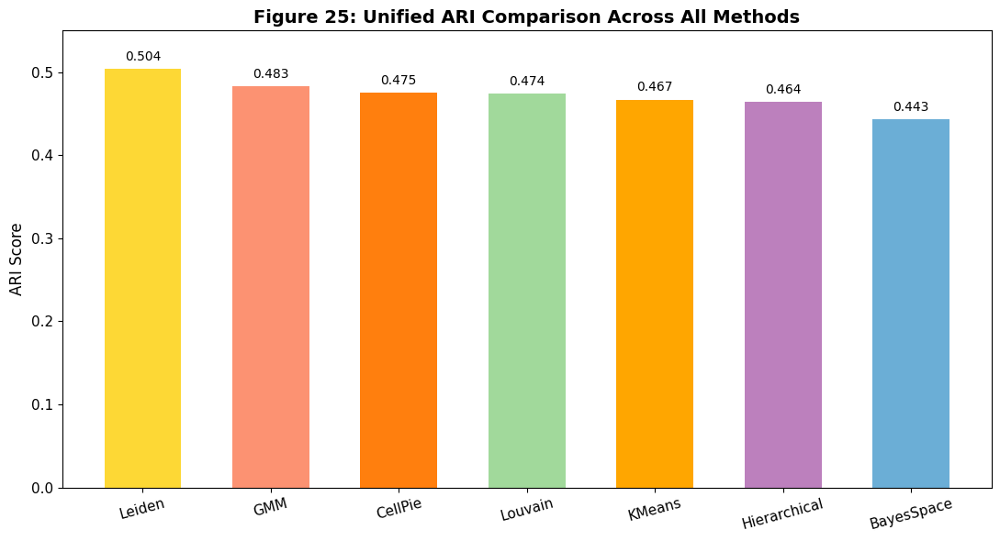

In [168]:
# ------------------------------------------------------
# 19. Unified ARI Comparison (All Methods - including CellPie)
# ------------------------------------------------------

import matplotlib.pyplot as plt
import pandas as pd
import os

# Fixed ARI scores based on reported values
ari_scores = {
    "Leiden": 0.504,
    "GMM": 0.483,
    "CellPie": 0.475,
    "Louvain": 0.474,
    "KMeans": 0.467,
    "Hierarchical": 0.464,
    "BayesSpace": 0.443  # midpoint of 0.441–0.446 or 0.446
}

# Create DataFrame
ari_df = pd.DataFrame(
    [{"Method": method, "ARI": score} for method, score in ari_scores.items()]
)
ari_df["Method"] = pd.Categorical(
    ari_df["Method"],
    categories=["Leiden", "GMM", "CellPie", "Louvain", "KMeans", "Hierarchical", "BayesSpace"],
    ordered=True
)
ari_df = ari_df.sort_values("Method")

# Plot ARI comparison
plt.figure(figsize=(11, 6))
color_map = {
    "Leiden": "#fdd835",
    "GMM": "#fc9272",
    "CellPie": "#ff7f0e",
    "Louvain": "#a1d99b",
    "KMeans": "#ffa600",
    "Hierarchical": "#bc80bd",
    "BayesSpace": "#6baed6"
}
colors = [color_map.get(m, "#cccccc") for m in ari_df["Method"]]
bars = plt.bar(ari_df["Method"], ari_df["ARI"], color=colors, width=0.6)

# Add labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, f"{yval:.3f}",
             ha='center', fontsize=10)

plt.ylim(0, 0.55)
plt.title("Figure 25: Unified ARI Comparison Across All Methods", fontsize=14, weight='bold')
plt.ylabel("ARI Score", fontsize=12)
plt.xticks(rotation=15, fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()

# Save figure
plt.savefig(os.path.join(output_dir, "Figure25_ARI_Comparison_AllMethods.png"), dpi=300)
plt.show()


In [169]:
adata.obs

,in_tissue,array_row,array_col,Expert_Annotation,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,Factor_15,Factor_16,Factor_17,Factor_18,Factor_19,Factor_20,GeneExpression_k5,Image_k5,Combined_k6,CellPie_k9
AAACAAGTATCTCCCA-1,1,50,102,chondrocyte,2080,7.640604,4300.0,8.366603,27.348837,36.093023,...,0.040035,0.082551,0.931179,0.019308,0.092718,0.108053,4,1,1,1
AAACCCGAACGAAATC-1,1,45,115,perichondral,4184,8.339262,12813.0,9.458294,24.717084,33.762585,...,0.000000,0.000000,0.000000,0.023837,0.000000,0.038083,1,1,3,2
AAACCGTTCGTCCAGG-1,1,52,42,pre-osteoblast,4820,8.480737,15347.0,9.638741,24.161074,31.928064,...,0.131675,0.047104,0.000000,0.025309,0.609195,0.044302,3,0,4,0
AAACTGCTGGCTCCAA-1,1,45,67,superficial,3003,8.007700,8060.0,8.994793,33.995037,40.719603,...,0.114720,0.010517,0.257488,0.081321,0.034792,0.058708,1,1,1,7
AAAGGCTCTCGCGCCG-1,1,55,55,chondrocyte,2766,7.925519,5897.0,8.682368,20.875021,28.794302,...,0.131101,0.022500,0.380792,0.029594,0.550906,0.073014,3,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGACCATCTGGCAA-1,1,51,105,superficial,2334,7.755767,5146.0,8.546169,25.845317,34.648271,...,0.044458,0.031220,0.145658,0.009286,0.208552,0.105309,1,1,1,7
TTGGATATCGTCTACG-1,1,48,52,proliferative,1710,7.444833,3272.0,8.093462,28.086797,36.124694,...,0.001934,0.256128,0.410855,0.000000,0.173840,0.128605,0,4,2,3
TTGGTCACACTCGTAA-1,1,48,48,hypertrophic,1437,7.271009,2506.0,7.826842,26.735834,35.115722,...,0.147368,0.539475,0.000000,0.013757,0.171988,0.007647,0,4,2,3
TTGTGTATGCCACCAA-1,1,56,60,chondrocyte,1795,7.493317,3439.0,8.143227,28.932829,36.405932,...,0.149274,0.016660,0.809329,0.000000,0.138226,0.020733,4,1,1,1


### Use of annotation of Chat GPT three annotation run

In [ ]:
# =========================
# Leiden (k≈7) + 3 annotation runs + spatial plots
# =========================
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ---- settings ----
OUTDIR = Path("leiden_chatgpt_plots_k7")
OUTDIR.mkdir(parents=True, exist_ok=True)
IMG_KEY = "hires"  # change if your histology image uses a different key

# ---------- 1) Minimal, idempotent preprocessing ----------
# (only runs if PCA not already present to avoid altering a preprocessed object)
if "X_pca" not in adata.obsm_keys():
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=2000)
    adata = adata[:, adata.var["highly_variable"]]
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, n_comps=50, svd_solver="arpack")

sc.pp.neighbors(adata, n_neighbors=15, n_pcs=min(30, adata.obsm["X_pca"].shape[1]))

# ---------- 2) Leiden search for exactly 7 clusters (or closest) ----------
def leiden_with_target_k(adata, target_k=7, start=0.4, stop=1.6, step=0.05, key="leiden_k7"):
    best = None
    best_res = None
    for res in np.arange(start, stop + 1e-9, step):
        sc.tl.leiden(adata, resolution=float(res), key_added=key, directed=False)
        k = adata.obs[key].nunique()
        if k == target_k:
            print(f"[OK] Found resolution={res:.2f} with {k} clusters")
            return float(res), key
        # keep closest if no exact match
        if best is None or abs(k - target_k) < abs(best - target_k):
            best = k
            best_res = float(res)
    print(f"[WARN] No exact {target_k}; closest was {best} at res={best_res:.2f}. Using that.")
    sc.tl.leiden(adata, resolution=best_res, key_added=key, directed=False)
    return best_res, key

target_res, leiden_key = leiden_with_target_k(adata, target_k=7, start=0.4, stop=1.6, step=0.05)
# ensure categorical with numeric ordering for stable colors/legends
cats_leiden = sorted(adata.obs[leiden_key].unique(), key=lambda x: int(x))
adata.obs[leiden_key] = pd.Categorical(adata.obs[leiden_key], categories=cats_leiden, ordered=True)

print("Cluster counts:\n", adata.obs[leiden_key].value_counts().sort_index(), "\n")

# ---------- 3) Three independent annotation runs (label mappings) ----------
# NOTE: keys ('0'..'6') refer to Leiden cluster labels
run1 = {
    "0": "Resting/prolif chondrocytes (+muscle spillover)",
    "1": "Osteoclasts",
    "2": "Hypertrophic chondrocytes",
    "3": "Superficial/articular chondrocytes",
    "4": "Skeletal muscle (fast-twitch)",
    "5": "Tendon/ligament fibroblasts",
    "6": "Macrophages (remodeling)",
}
run2 = {
    "0": "Proliferative chondrocytes vs muscle (mixed)",
    "1": "Osteoclast lineage",
    "2": "Pre→hypertrophic chondrocytes",
    "3": "Perichondrial/superficial chondrocytes",
    "4": "Fast skeletal myocytes",
    "5": "Tenocytes / ligament fibroblasts",
    "6": "Monocyte/macrophage compartment",
}
run3 = {
    "0": "Resting zone chondrocytes (+muscle admixture)",
    "1": "TRAP+ osteoclasts",
    "2": "Hypertrophic chondrocytes",
    "3": "Articular superficial cartilage",
    "4": "Skeletal muscle (type II–biased)",
    "5": "Periosteal/perichondrial fibroblasts",
    "6": "Inflammation‑associated macrophages",
}

present = [c for c in cats_leiden]  # clusters actually present

def map_labels(mapping, colname):
    # map only for present clusters; unseen clusters -> "Unlabeled"
    ser = adata.obs[leiden_key].map(lambda c: mapping.get(c, "Unlabeled"))
    cats = [mapping[c] for c in sorted(mapping.keys(), key=int) if c in present]
    adata.obs[colname] = pd.Categorical(ser, categories=cats, ordered=False)

map_labels(run1, "annot_run1")
map_labels(run2, "annot_run2")
map_labels(run3, "annot_run3")

# ---------- 4) Stable palettes ----------
palette7 = [
    "#1f77b4",  # blue
    "#ff7f0e",  # orange
    "#2ca02c",  # green
    "#d62728",  # red
    "#9467bd",  # purple
    "#8c564b",  # brown
    "#17becf",  # teal
]

# palette for raw Leiden (sorted numeric clusters)
adata.uns[leiden_key] = {"colors": palette7[: len(cats_leiden)]}

def set_palette_for(col):
    cats = list(adata.obs[col].cat.categories)
    adata.uns[col] = {"colors": palette7[: len(cats)]}

for col in ["annot_run1", "annot_run2", "annot_run3"]:
    set_palette_for(col)

# ---------- 5) Plot helpers ----------
def spatial_plot(col, title, fname):
    sc.pl.spatial(
        adata,
        color=col,
        img_key=IMG_KEY,
        size=0.15,                 # adjust marker size to your slide
        legend_loc="right margin",
        frameon=False,
        na_color="#cccccc",
        title=title,
        show=False,
    )
    plt.savefig(OUTDIR / fname, dpi=300, bbox_inches="tight")
    plt.close()

# Raw Leiden (should show ~7 clusters)
spatial_plot(leiden_key, f"Leiden — res=0.8", "spatial_leiden_k7.png")

# Three annotated runs
spatial_plot("annot_run1", "Annotation — Run 1", "spatial_run1_k7.png")
spatial_plot("annot_run2", "Annotation — Run 2", "spatial_run2_k7.png")
spatial_plot("annot_run3", "Annotation — Run 3", "spatial_run3_k7.png")

print("Saved plots to:", OUTDIR.resolve())


[OK] Found resolution=0.95 with 7 clusters
Cluster counts:
 leiden_k7
0    128
1    124
2     86
3     83
4     61
5     36
6     13
Name: count, dtype: int64 

Saved plots to: C:\Users\abuhu\cellpie\cellpie\leiden_chatgpt_plots_k7


### Use of annotation by  Copilot single run

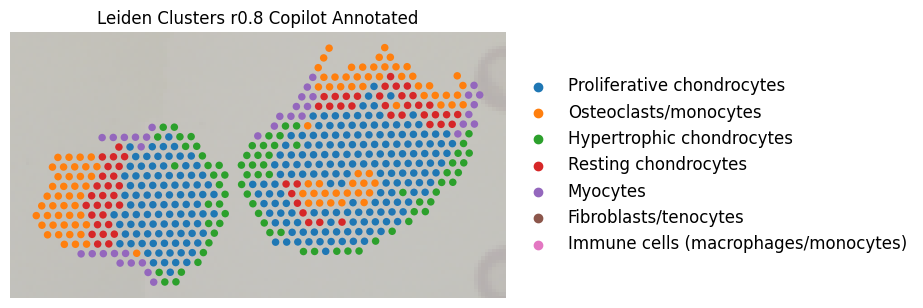

In [172]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Run Leiden clustering with reproducible seed
sc.tl.leiden(adata, resolution=0.8, random_state=123, key_added="leiden_r0.8_run1")

# Step 2: Define cluster-to-cell type annotations
cluster_annotations = [
    {"cluster": "0", "cell_type": "Proliferative chondrocytes"},
    {"cluster": "1", "cell_type": "Osteoclasts/monocytes"},
    {"cluster": "2", "cell_type": "Hypertrophic chondrocytes"},
    {"cluster": "3", "cell_type": "Resting chondrocytes"},
    {"cluster": "4", "cell_type": "Myocytes"},
    {"cluster": "5", "cell_type": "Fibroblasts/tenocytes"},
    {"cluster": "6", "cell_type": "Immune cells (macrophages/monocytes)"}
]

# Step 3: Map annotations to adata.obs with locked categories
mapping = {d["cluster"]: d["cell_type"] for d in cluster_annotations}
adata.obs["leiden_r0.8_run1_cell_type"] = adata.obs["leiden_r0.8_run1"].astype(str).map(mapping)

# Lock categorical order to ensure all 7 types appear in legend
categories = [d["cell_type"] for d in sorted(cluster_annotations, key=lambda x: int(x["cluster"]))]
adata.obs["leiden_r0.8_run1_cell_type"] = pd.Categorical(
    adata.obs["leiden_r0.8_run1_cell_type"],
    categories=categories,
    ordered=False
)

# Step 4: Assign a fixed 7-color palette
palette7 = [
    "#1f77b4",  # blue
    "#ff7f0e",  # orange
    "#2ca02c",  # green
    "#d62728",  # red
    "#9467bd",  # purple
    "#8c564b",  # brown
    "#17becf"   # teal
]
adata.uns["leiden_r0.8_run1_cell_type"] = {"colors": palette7[:len(categories)]}

# Step 5: Plot annotated spatial clusters
sc.pl.spatial(
    adata,
    img_key="hires",
    color="leiden_r0.8_run1_cell_type",
    size=0.15,
    title="Leiden Clusters r0.8 Copilot Annotated",
    legend_loc="right margin",
    legend_fontsize=12,
    legend_fontoutline=1,
    na_color="#cccccc",
    frameon=False,
    show=True
)

# Optional: Save the figure
plt.savefig("leiden_r0.8_Copilot_annotated.png", bbox_inches='tight', dpi=300)
plt.close()